## Test Model 2030

In [137]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [30]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_IT\\20240319_IT3zeroem\\elec_s_3_ec_lv1.5_Co2L0.0-3h.nc")


INFO:pypsa.io:Imported network elec_s_3_ec_lv1.5_Co2L0.0-3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [31]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 6 entries
Component 'Carrier' has 23 entries
Component 'GlobalConstraint' has 2 entries
Component 'Line' has 1 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 7 entries
Component 'Load' has 3 entries
Component 'Generator' has 44 entries
Component 'StorageUnit' has 9 entries
Component 'Store' has 3 entries


In [32]:
n.generators.loc['IT0 0 CCGT','marginal_cost']

46.81351362802638

In [33]:
# set marginal cost of load shedding to €
#for bus in n.generators.bus:
#    for index in n.generators.index:
#        if not bus.endswith('H2') and index.endswith('load'):
#            n.generators.loc[index, 'marginal_cost'] = 1000


In [34]:
#solve network
#n.optimize(solver_name='gurobi')
n.lopf(solver_name='gurobi')

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2918086421.py:3: DeprecatedWarning: lopf is deprecated as of 0.24 and will be removed in 1.0. Use linopy-based function ``n.optimize()`` instead. Migrate extra functionalities: https://pypsa.readthedocs.io/en/latest/examples/optimization-with-linopy-migrate-extra-functionalities.html.
  n.lopf(solver_name='gurobi')
INFO:pypsa.linopf:Prepare linear problem


INFO:pypsa.linopf:Total preparation time: 4.04s
INFO:pypsa.linopf:Solve linear problem using Gurobi solver


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\pypsa-problem-9j78ditb.lp
Reading time = 2.18 seconds
obj: 531442 rows, 256989 columns, 997217 nonzeros
Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 4 logical processors, using up to 4 threads

Optimize a model with 531442 rows, 256989 columns and 997217 nonzeros
Model fingerprint: 0xf54e32ca
Coefficient statistics:
  Matrix range     [1e-03, 8e+02]
  Objective range  [3e-02, 2e+05]
  Bounds range     [4e+00, 2e+09]
  RHS range        [3e+00, 1e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 398579 rows and 86220 columns
Presolve time: 0.63s
Presolved: 132863 rows, 170769 columns, 451103 nonzeros

Concurrent LP optimizer: dual simplex and barrier
Showing barrier log only...

Ordering t

INFO:pypsa.linopf:Optimization successful. Objective value: 2.21e+10


('ok', 'optimal')

In [35]:
def system_cost(n): #n.statistics.capex()
    tsc = n.statistics.capex() + n.statistics.opex()
    return tsc.droplevel(0).div(1e6) # million €/a

In [36]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


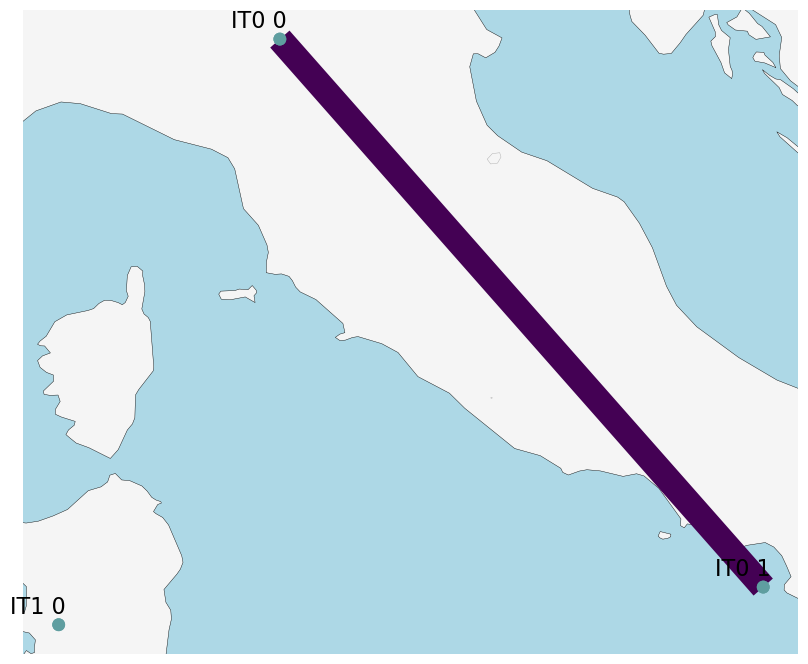

In [37]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [38]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


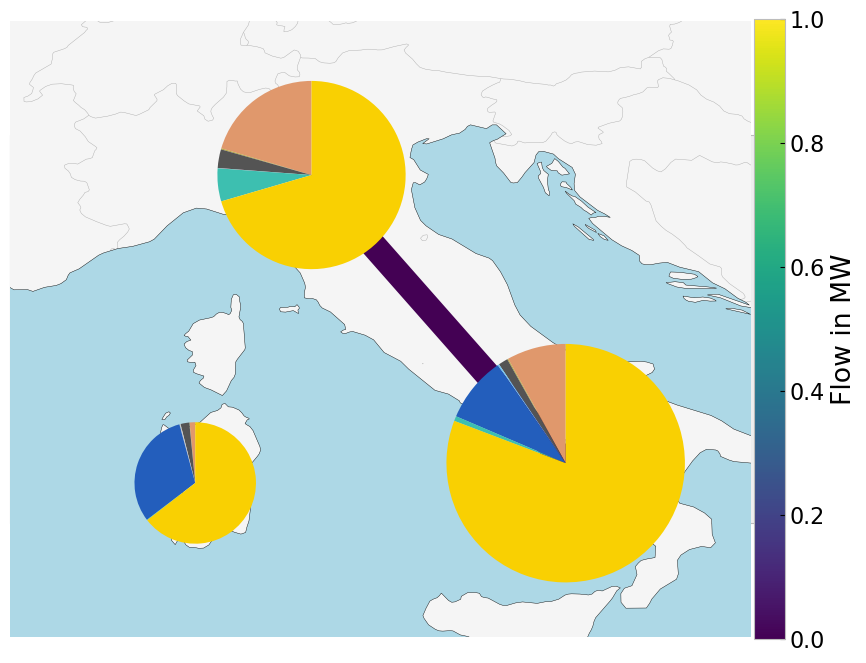

In [39]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [40]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3735415306.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


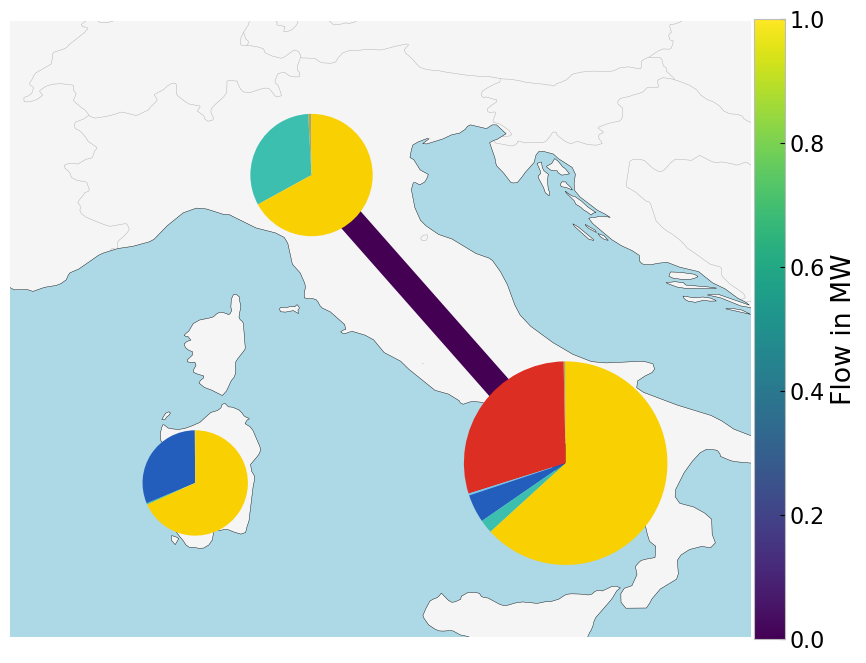

In [41]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

In [42]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity in Italy"
    )

    plt.show()
    return capacities

<Figure size 640x480 with 0 Axes>

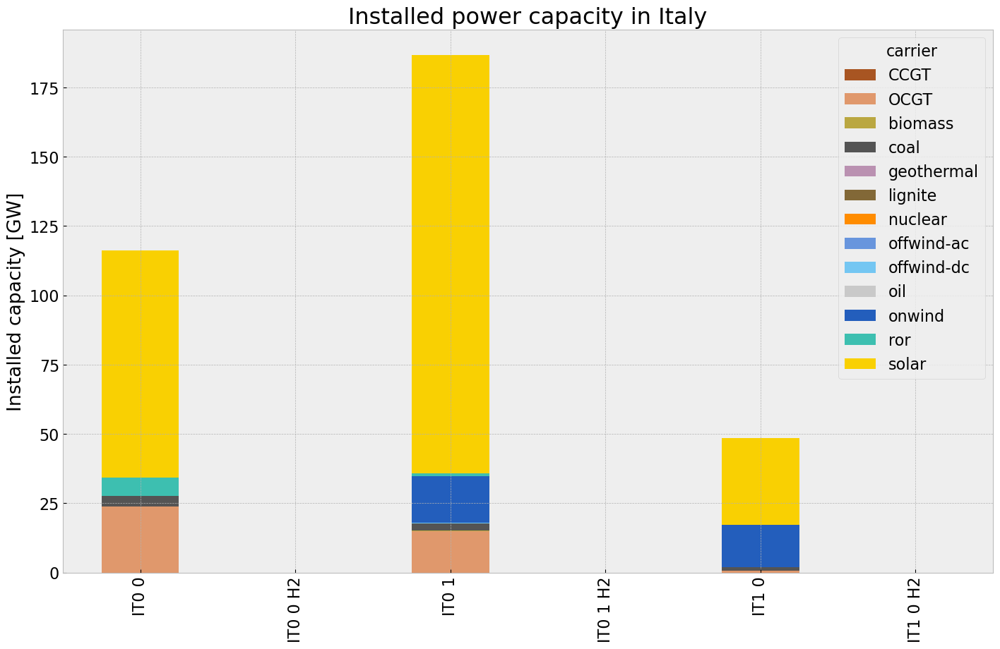

In [43]:
# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)


## Generation

In [140]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                #title=f"Generated electricity in Italy in {year}"
    )

    plt.show()
    return generations

<Figure size 640x480 with 0 Axes>

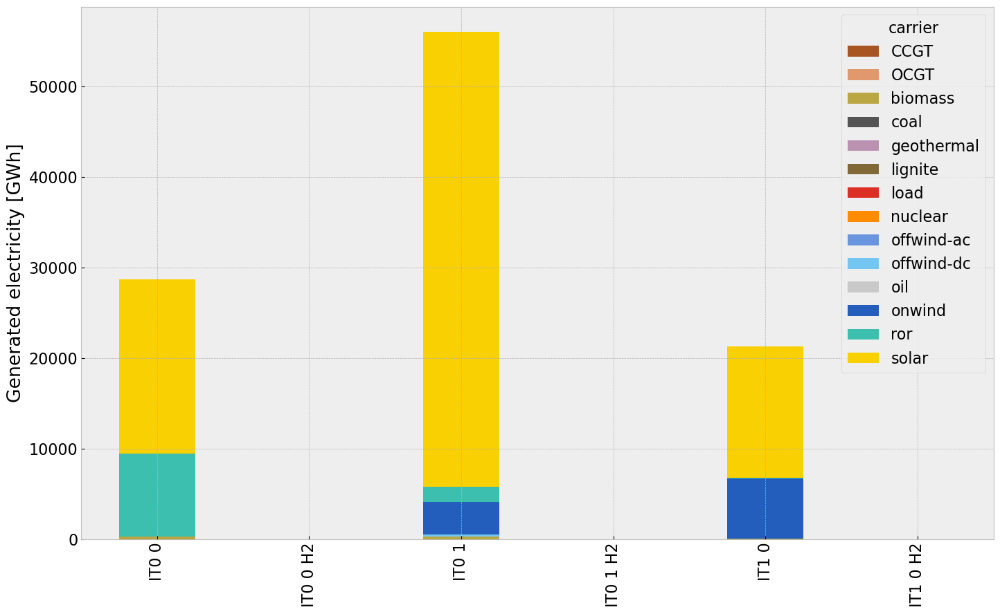

In [141]:
gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [142]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2983392203.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2983392203.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [143]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [144]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    p_by_carrier['load'] /= 1e3

    #links 
    links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    links = links.drop(columns='DC', inplace=False)
    links['H2 fuel cell']*=-1

    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
        
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    n.loads_t.p_set.sum(axis=1).loc[time].div(1e3).plot(ax=ax, c='k',grid=True)

    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [145]:
p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)

#links 
links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)

links = links.drop(columns='DC', inplace=False)
links['H2 fuel cell']*=-1
    
if not n.storage_units.empty:
    sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
    p_by_carrier = pd.concat([p_by_carrier, sto, links], axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2751733251.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2751733251.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2751733251.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2435897715.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2435897715.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].sum(axis=1).plot(ax=ax)


(20.0, 100.0)

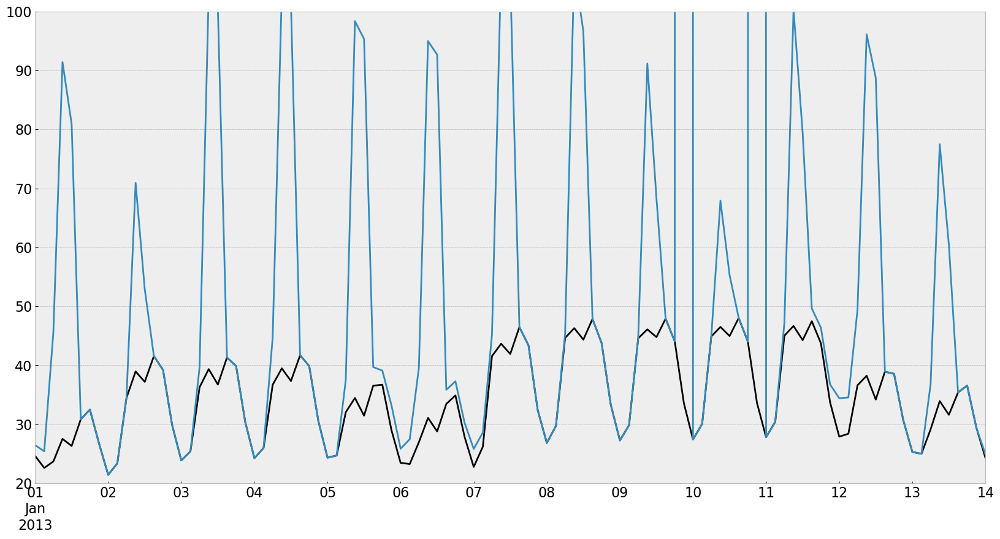

In [146]:
fig, ax = plt.subplots(figsize=(20, 10))
n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)
p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-01', end='2013-01-14', freq='3H')].sum(axis=1).plot(ax=ax)
ax.set_ylim(20,100)

In [147]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [148]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [149]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [150]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

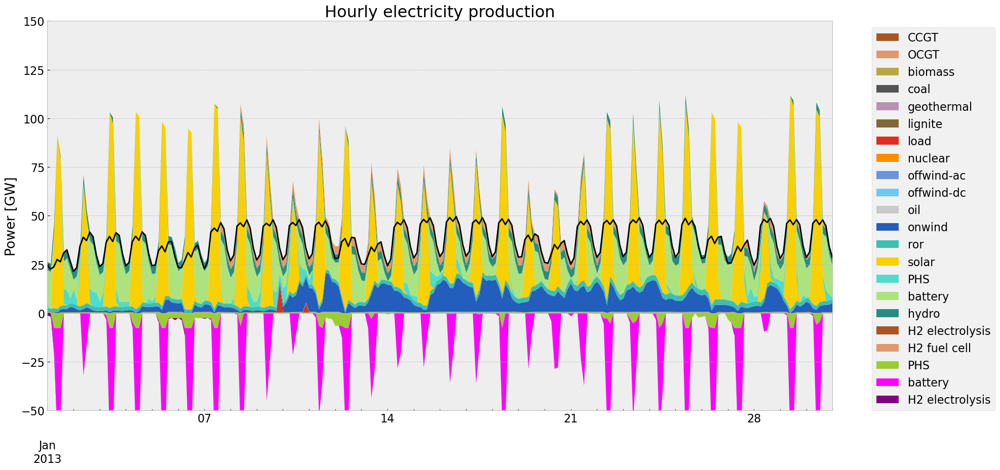

In [151]:
# winter
gen_curve(n, '2013-01-01', '2013-01-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

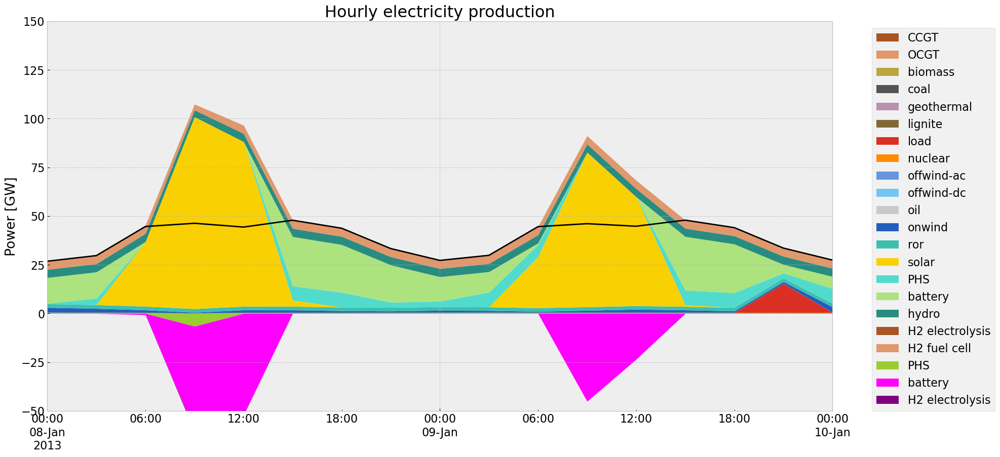

In [152]:

gen_curve(n, '2013-01-08', '2013-01-10', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

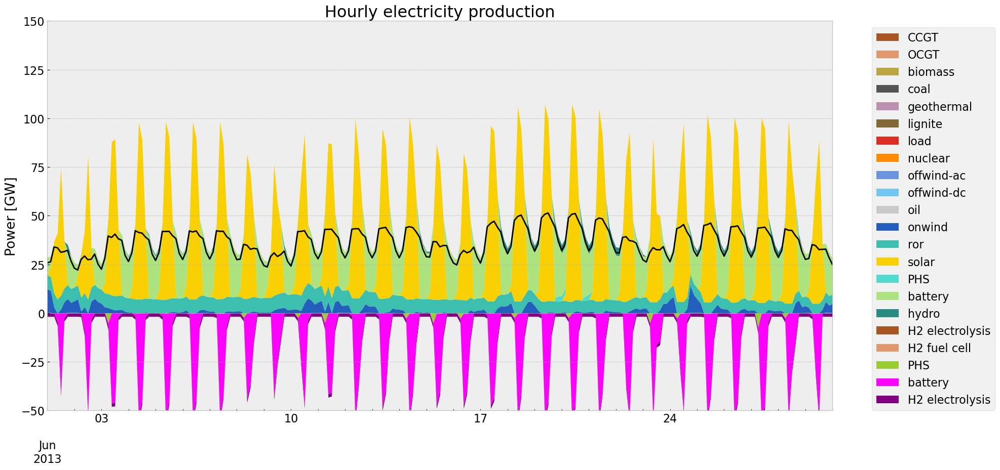

In [153]:
#summer
gen_curve(n, '2013-06-01', '2013-06-30', colors_gen)

## Storage

In [154]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,6.478689,3.5108
IT0 1,2.3960,37.106170,0.6060
IT1 0,0.2400,9.927835,0.0780


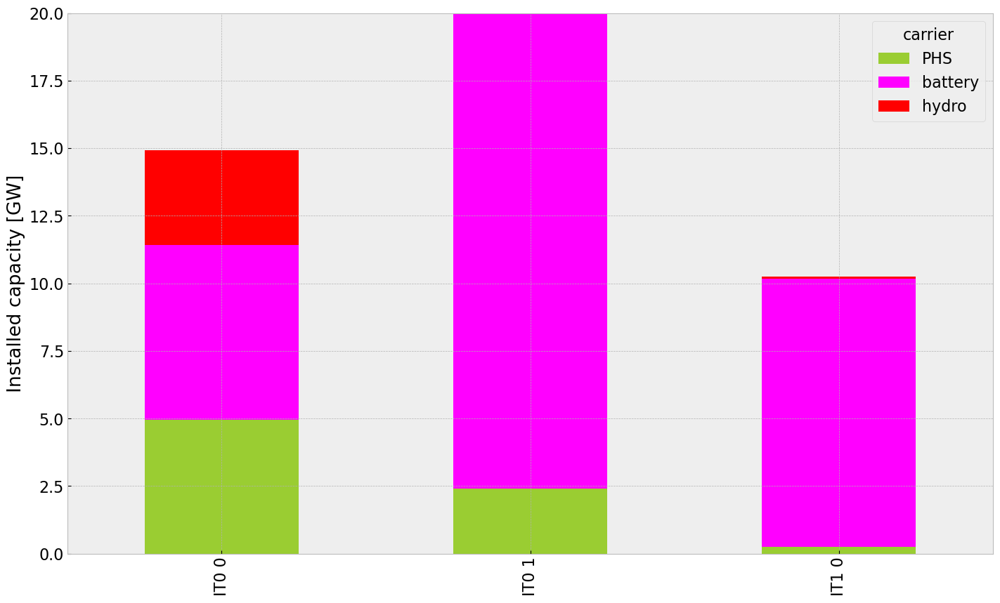

In [155]:
inst_store_table(n)

In [156]:
n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000

carrier,H2
bus,
IT0 0 H2,5432.110369
IT0 1 H2,2854.705190
IT1 0 H2,0.000000


In [157]:
def inst_storeh2_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.stores.groupby(['bus','carrier']).e_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["blue"],
                                grid=True,
                                xlabel="",
                                ylabel="H2 Store Energy Capacity [GWh]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,7500]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,6.478689,3.5108
IT0 1,2.3960,37.106170,0.6060
IT1 0,0.2400,9.927835,0.0780


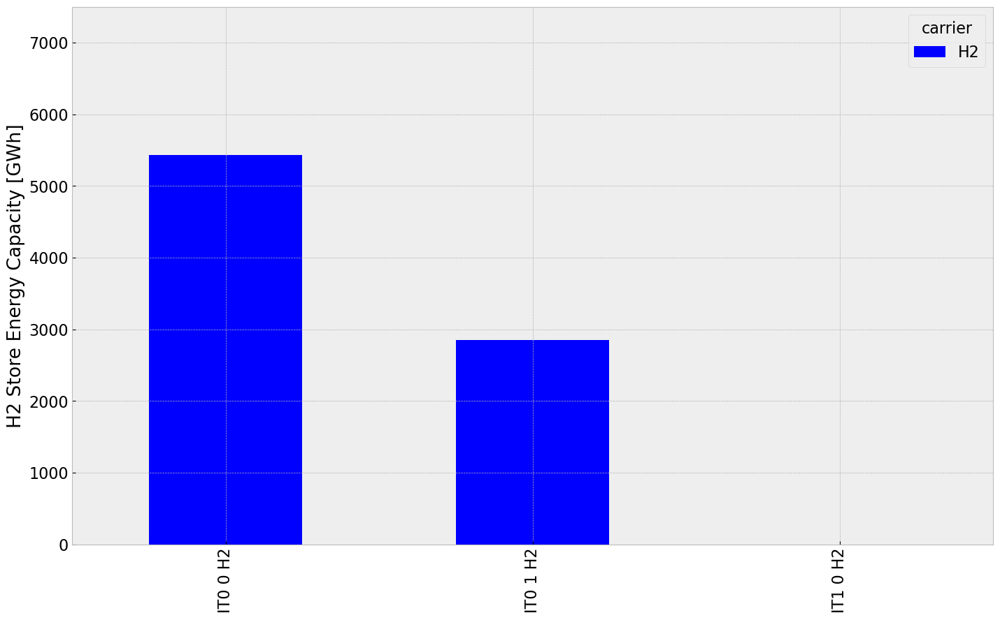

In [158]:
inst_storeh2_table(n)

In [159]:
n.stores

,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,marginal_cost,build_year,e_nom_opt,type,e_nom,e_nom_mod,e_nom_min,e_nom_max,e_min_pu,e_max_pu,e_initial,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,standing_loss,lifetime
Store,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 H2,IT0 0 H2,H2,True,True,148.31893,0.010733,0,5.432110e+06,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
IT0 1 H2,IT0 1 H2,H2,True,True,148.31893,0.009501,0,2.854705e+06,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf
IT1 0 H2,IT1 0 H2,H2,True,True,148.31893,0.009966,0,0.000000e+00,,0.0,0.0,0.0,inf,0.0,1.0,0.0,False,True,0.0,0.0,1.0,0.0,0.0,inf


In [160]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


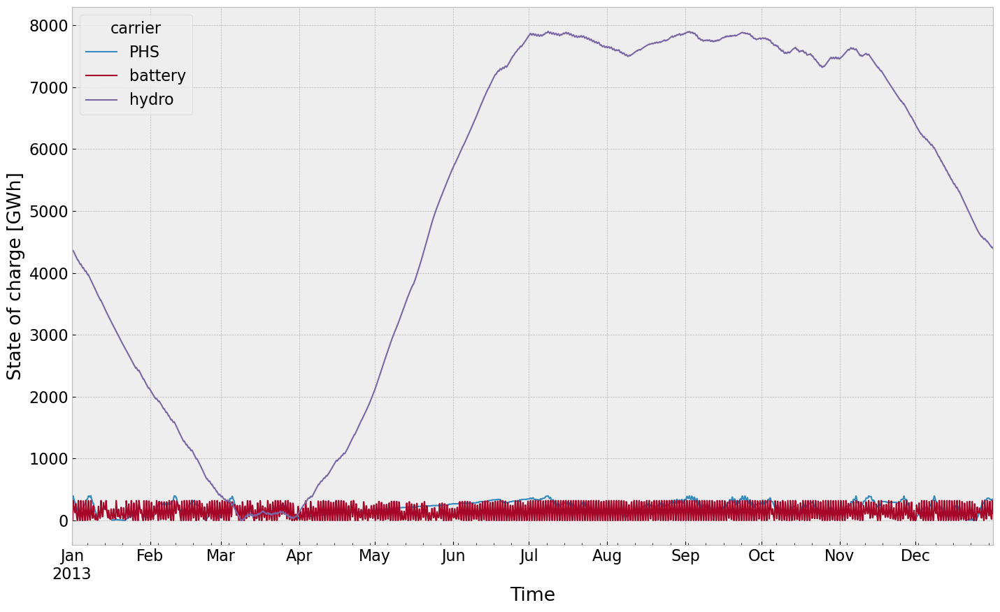

In [161]:
state_of_charge_plot(n)

## Electricity Price

In [162]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [163]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    


#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


In [164]:
n.buses_t.marginal_price['IT1 0'].sort_values(ascending=False).head(20)

snapshot
2013-11-29 15:00:00    1010.013501
2013-11-29 00:00:00    1010.013501
2013-11-27 15:00:00    1010.013501
2013-01-08 15:00:00    1010.013501
2013-11-27 21:00:00    1010.013501
2013-11-28 00:00:00    1010.013501
2013-11-28 03:00:00    1010.013501
2013-01-09 15:00:00    1010.013501
2013-11-28 15:00:00    1010.013501
2013-11-28 18:00:00    1010.013501
2013-11-28 21:00:00    1010.013501
2013-11-29 03:00:00    1010.013501
2013-01-09 21:00:00    1010.013501
2013-11-29 18:00:00    1010.013501
2013-11-29 21:00:00    1010.013501
2013-11-30 00:00:00    1010.013501
2013-11-30 03:00:00    1010.013501
2013-01-09 06:00:00    1010.013501
2013-01-09 03:00:00    1010.013501
2013-01-09 00:00:00    1010.013501
Name: IT1 0, dtype: float64

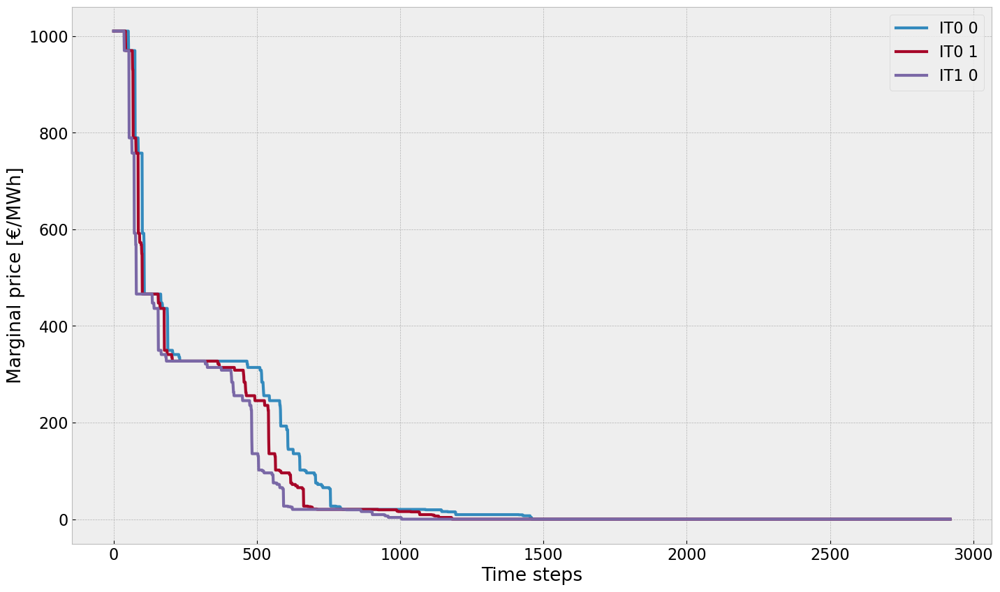

In [165]:
price_dur_curve_plot(n)

In [166]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

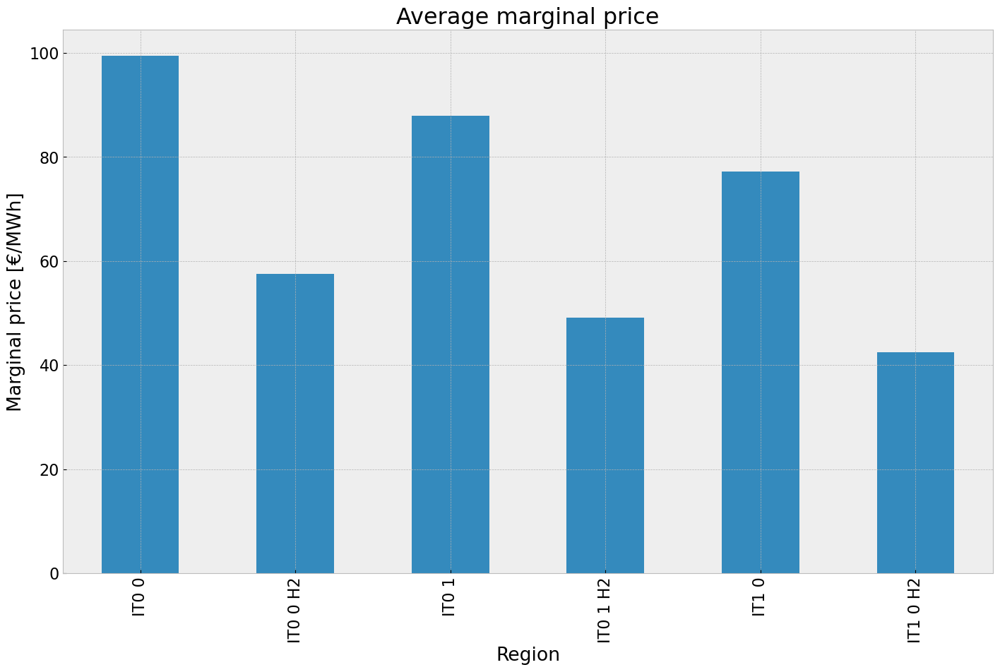

In [167]:
price_regions_table(n)

# Volcano Erruption Scenario
eruption start: 01.06.2013
reduction on radiation: 10%, source:
duration : until year end

In [168]:
#copy network
n1=n.copy()

#p_max_pu of solar generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
eruption_start=pd.to_datetime('2013-06-01 00:00:00')
for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= eruption_start:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.9 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                if new_p_max_pu<0:
                                    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

In [169]:
n1.generators_t.p_max_pu.sum()

Generator
IT0 0 offwind-ac     487.384979
IT0 0 offwind-dc     604.391882
IT0 0 onwind         142.342859
IT0 0 ror           1398.010907
IT0 0 solar          382.740666
IT0 1 offwind-ac     540.778674
IT0 1 offwind-dc     858.589210
IT0 1 onwind         299.740456
IT0 1 ror           1398.010907
IT0 1 solar          437.904781
IT1 0 offwind-ac     811.941052
IT1 0 onwind         565.816181
IT1 0 ror           1398.010907
IT1 0 solar          440.702972
dtype: float64

## 1. Scenario: allow additional investment of extendable generators and storage

In [170]:
n1.optimize.create_model()


Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [171]:
#solve network

n1.optimize(solver_name='gurobi')

Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')
Index(['IT0 1 offwind-dc'], dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:00<00:00, 15.55it/s]
INFO:linopy.io: Writing time: 6.5s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r8fr4j91.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-r8fr4j91.lp


Reading time = 1.90 seconds


INFO:gurobipy:Reading time = 1.90 seconds


obj: 531483 rows, 256950 columns, 997219 nonzeros


INFO:gurobipy:obj: 531483 rows, 256950 columns, 997219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 531483 rows, 256950 columns and 997219 nonzeros


INFO:gurobipy:Optimize a model with 531483 rows, 256950 columns and 997219 nonzeros


Model fingerprint: 0xf42fd466


INFO:gurobipy:Model fingerprint: 0xf42fd466


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 401426 rows and 86182 columns


INFO:gurobipy:Presolve removed 401426 rows and 86182 columns


Presolve time: 0.65s


INFO:gurobipy:Presolve time: 0.65s


Presolved: 130057 rows, 170768 columns, 445491 nonzeros


INFO:gurobipy:Presolved: 130057 rows, 170768 columns, 445491 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.14s


INFO:gurobipy:Ordering time: 0.14s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 24


INFO:gurobipy: Dense cols : 24


 AA' NZ     : 3.185e+05


INFO:gurobipy: AA' NZ     : 3.185e+05


 Factor NZ  : 2.097e+06 (roughly 140 MB of memory)


INFO:gurobipy: Factor NZ  : 2.097e+06 (roughly 140 MB of memory)


 Factor Ops : 5.805e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 5.805e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   6.52602260e+13 -2.43509597e+15  4.40e+07 1.17e+04  7.97e+10     1s


INFO:gurobipy:   0   6.52602260e+13 -2.43509597e+15  4.40e+07 1.17e+04  7.97e+10     1s


   1   5.77881792e+13 -1.27530613e+15  3.48e+07 3.66e+03  4.42e+10     1s


INFO:gurobipy:   1   5.77881792e+13 -1.27530613e+15  3.48e+07 3.66e+03  4.42e+10     1s


   2   5.15021777e+13 -7.84766369e+14  2.66e+07 9.21e+02  2.74e+10     1s


INFO:gurobipy:   2   5.15021777e+13 -7.84766369e+14  2.66e+07 9.21e+02  2.74e+10     1s


   3   3.41041938e+13 -5.90344063e+14  6.83e+06 4.75e+02  8.60e+09     2s


INFO:gurobipy:   3   3.41041938e+13 -5.90344063e+14  6.83e+06 4.75e+02  8.60e+09     2s


   4   2.74654881e+13 -1.65226568e+14  1.58e+06 3.21e+01  1.86e+09     2s


INFO:gurobipy:   4   2.74654881e+13 -1.65226568e+14  1.58e+06 3.21e+01  1.86e+09     2s


   5   1.49604143e+13 -2.67875650e+13  1.73e+05 1.95e+00  2.37e+08     2s


INFO:gurobipy:   5   1.49604143e+13 -2.67875650e+13  1.73e+05 1.95e+00  2.37e+08     2s


   6   1.28400655e+13 -1.18608864e+13  1.51e+05 5.18e-01  1.51e+08     2s


INFO:gurobipy:   6   1.28400655e+13 -1.18608864e+13  1.51e+05 5.18e-01  1.51e+08     2s


   7   3.53435638e+12 -7.90824013e+12  3.66e+04 2.46e-01  5.01e+07     3s


INFO:gurobipy:   7   3.53435638e+12 -7.90824013e+12  3.66e+04 2.46e-01  5.01e+07     3s


   8   6.17536766e+11 -3.48161210e+12  5.31e+03 7.55e-02  1.34e+07     3s


INFO:gurobipy:   8   6.17536766e+11 -3.48161210e+12  5.31e+03 7.55e-02  1.34e+07     3s


   9   3.74319645e+11 -1.49395916e+12  2.75e+03 2.89e-02  5.86e+06     3s


INFO:gurobipy:   9   3.74319645e+11 -1.49395916e+12  2.75e+03 2.89e-02  5.86e+06     3s


  10   2.58518553e+11 -1.07575828e+12  1.57e+03 2.05e-02  4.01e+06     3s


INFO:gurobipy:  10   2.58518553e+11 -1.07575828e+12  1.57e+03 2.05e-02  4.01e+06     3s


  11   1.47264056e+11 -5.62995348e+11  7.06e+02 1.03e-02  2.05e+06     3s


INFO:gurobipy:  11   1.47264056e+11 -5.62995348e+11  7.06e+02 1.03e-02  2.05e+06     3s


  12   8.91413964e+10 -2.49525689e+11  3.16e+02 4.51e-03  9.56e+05     4s


INFO:gurobipy:  12   8.91413964e+10 -2.49525689e+11  3.16e+02 4.51e-03  9.56e+05     4s


  13   6.94777449e+10 -1.09729807e+11  2.12e+02 2.09e-03  5.02e+05     4s


INFO:gurobipy:  13   6.94777449e+10 -1.09729807e+11  2.12e+02 2.09e-03  5.02e+05     4s


  14   5.18991420e+10 -4.86693525e+10  1.31e+02 1.08e-03  2.80e+05     4s


INFO:gurobipy:  14   5.18991420e+10 -4.86693525e+10  1.31e+02 1.08e-03  2.80e+05     4s


  15   4.24525006e+10 -2.20325941e+10  8.95e+01 6.62e-04  1.79e+05     4s


INFO:gurobipy:  15   4.24525006e+10 -2.20325941e+10  8.95e+01 6.62e-04  1.79e+05     4s


  16   3.61266707e+10 -9.25432199e+09  6.13e+01 4.66e-04  1.26e+05     4s


INFO:gurobipy:  16   3.61266707e+10 -9.25432199e+09  6.13e+01 4.66e-04  1.26e+05     4s


  17   3.42893153e+10  5.79779947e+09  5.27e+01 2.36e-04  7.87e+04     5s


INFO:gurobipy:  17   3.42893153e+10  5.79779947e+09  5.27e+01 2.36e-04  7.87e+04     5s


  18   3.10988027e+10  8.82723150e+09  3.81e+01 1.91e-04  6.15e+04     5s


INFO:gurobipy:  18   3.10988027e+10  8.82723150e+09  3.81e+01 1.91e-04  6.15e+04     5s


  19   2.85940759e+10  1.14853514e+10  2.72e+01 1.51e-04  4.72e+04     5s


INFO:gurobipy:  19   2.85940759e+10  1.14853514e+10  2.72e+01 1.51e-04  4.72e+04     5s


  20   2.69583429e+10  1.66449700e+10  2.00e+01 7.86e-05  2.84e+04     5s


INFO:gurobipy:  20   2.69583429e+10  1.66449700e+10  2.00e+01 7.86e-05  2.84e+04     5s


  21   2.59149160e+10  1.87649525e+10  1.52e+01 5.08e-05  1.97e+04     5s


INFO:gurobipy:  21   2.59149160e+10  1.87649525e+10  1.52e+01 5.08e-05  1.97e+04     5s


  22   2.52942065e+10  1.98761053e+10  1.22e+01 3.64e-05  1.49e+04     6s


INFO:gurobipy:  22   2.52942065e+10  1.98761053e+10  1.22e+01 3.64e-05  1.49e+04     6s


  23   2.46223866e+10  2.03888201e+10  9.15e+00 2.98e-05  1.17e+04     6s


INFO:gurobipy:  23   2.46223866e+10  2.03888201e+10  9.15e+00 2.98e-05  1.17e+04     6s


  24   2.42022038e+10  2.10114646e+10  7.12e+00 2.19e-05  8.79e+03     6s


INFO:gurobipy:  24   2.42022038e+10  2.10114646e+10  7.12e+00 2.19e-05  8.79e+03     6s


  25   2.37844982e+10  2.13953799e+10  5.16e+00 1.71e-05  6.58e+03     6s


INFO:gurobipy:  25   2.37844982e+10  2.13953799e+10  5.16e+00 1.71e-05  6.58e+03     6s


  26   2.34801217e+10  2.18324272e+10  3.61e+00 1.17e-05  4.54e+03     7s


INFO:gurobipy:  26   2.34801217e+10  2.18324272e+10  3.61e+00 1.17e-05  4.54e+03     7s


  27   2.33697954e+10  2.20492068e+10  3.04e+00 9.09e-06  3.64e+03     7s


INFO:gurobipy:  27   2.33697954e+10  2.20492068e+10  3.04e+00 9.09e-06  3.64e+03     7s


  28   2.32254042e+10  2.21500906e+10  2.29e+00 7.83e-06  2.96e+03     7s


INFO:gurobipy:  28   2.32254042e+10  2.21500906e+10  2.29e+00 7.83e-06  2.96e+03     7s


  29   2.31087513e+10  2.23557373e+10  1.64e+00 5.40e-06  2.07e+03     7s


INFO:gurobipy:  29   2.31087513e+10  2.23557373e+10  1.64e+00 5.40e-06  2.07e+03     7s


  30   2.30183753e+10  2.24940621e+10  1.15e+00 3.70e-06  1.44e+03     8s


INFO:gurobipy:  30   2.30183753e+10  2.24940621e+10  1.15e+00 3.70e-06  1.44e+03     8s


  31   2.29767344e+10  2.25869985e+10  9.21e-01 2.61e-06  1.07e+03     8s


INFO:gurobipy:  31   2.29767344e+10  2.25869985e+10  9.21e-01 2.61e-06  1.07e+03     8s


  32   2.29524571e+10  2.26095567e+10  8.00e-01 2.34e-06  9.44e+02     8s


INFO:gurobipy:  32   2.29524571e+10  2.26095567e+10  8.00e-01 2.34e-06  9.44e+02     8s


  33   2.29290348e+10  2.26387175e+10  6.70e-01 2.00e-06  8.00e+02     8s


INFO:gurobipy:  33   2.29290348e+10  2.26387175e+10  6.70e-01 2.00e-06  8.00e+02     8s


  34   2.28949555e+10  2.26688130e+10  4.71e-01 1.65e-06  6.23e+02     9s


INFO:gurobipy:  34   2.28949555e+10  2.26688130e+10  4.71e-01 1.65e-06  6.23e+02     9s


  35   2.28805314e+10  2.27017128e+10  3.89e-01 1.29e-06  4.92e+02     9s


INFO:gurobipy:  35   2.28805314e+10  2.27017128e+10  3.89e-01 1.29e-06  4.92e+02     9s


  36   2.28758399e+10  2.27106752e+10  3.61e-01 1.19e-06  4.55e+02     9s


INFO:gurobipy:  36   2.28758399e+10  2.27106752e+10  3.61e-01 1.19e-06  4.55e+02     9s


  37   2.28619190e+10  2.27302597e+10  2.72e-01 9.70e-07  3.63e+02     9s


INFO:gurobipy:  37   2.28619190e+10  2.27302597e+10  2.72e-01 9.70e-07  3.63e+02     9s


  38   2.28508354e+10  2.27531944e+10  2.01e-01 7.06e-07  2.69e+02     9s


INFO:gurobipy:  38   2.28508354e+10  2.27531944e+10  2.01e-01 7.06e-07  2.69e+02     9s


  39   2.28417530e+10  2.27658473e+10  1.44e-01 5.64e-07  2.09e+02    10s


INFO:gurobipy:  39   2.28417530e+10  2.27658473e+10  1.44e-01 5.64e-07  2.09e+02    10s


  40   2.28373012e+10  2.27816728e+10  1.17e-01 3.89e-07  1.53e+02    10s


INFO:gurobipy:  40   2.28373012e+10  2.27816728e+10  1.17e-01 3.89e-07  1.53e+02    10s


  41   2.28343522e+10  2.27923660e+10  9.96e-02 2.70e-07  1.16e+02    10s


INFO:gurobipy:  41   2.28343522e+10  2.27923660e+10  9.96e-02 2.70e-07  1.16e+02    10s


  42   2.28332830e+10  2.27939659e+10  9.33e-02 2.51e-07  1.08e+02    10s


INFO:gurobipy:  42   2.28332830e+10  2.27939659e+10  9.33e-02 2.51e-07  1.08e+02    10s


  43   2.28298787e+10  2.27981089e+10  7.42e-02 2.05e-07  8.75e+01    11s


INFO:gurobipy:  43   2.28298787e+10  2.27981089e+10  7.42e-02 2.05e-07  8.75e+01    11s


  44   2.28270697e+10  2.28019279e+10  5.75e-02 1.62e-07  6.92e+01    11s


INFO:gurobipy:  44   2.28270697e+10  2.28019279e+10  5.75e-02 1.62e-07  6.92e+01    11s


  45   2.28242695e+10  2.28070349e+10  4.14e-02 1.04e-07  4.75e+01    11s


INFO:gurobipy:  45   2.28242695e+10  2.28070349e+10  4.14e-02 1.04e-07  4.75e+01    11s


  46   2.28209517e+10  2.28116027e+10  2.27e-02 5.38e-08  2.58e+01    11s


INFO:gurobipy:  46   2.28209517e+10  2.28116027e+10  2.27e-02 5.38e-08  2.58e+01    11s


  47   2.28177185e+10  2.28126626e+10  5.04e-03 4.15e-08  1.39e+01    12s


INFO:gurobipy:  47   2.28177185e+10  2.28126626e+10  5.04e-03 4.15e-08  1.39e+01    12s


  48   2.28172886e+10  2.28152184e+10  2.91e-03 1.77e-08  5.70e+00    12s


INFO:gurobipy:  48   2.28172886e+10  2.28152184e+10  2.91e-03 1.77e-08  5.70e+00    12s


  49   2.28170497e+10  2.28155618e+10  1.88e-03 4.31e-08  4.10e+00    12s


INFO:gurobipy:  49   2.28170497e+10  2.28155618e+10  1.88e-03 4.31e-08  4.10e+00    12s


  50   2.28169003e+10  2.28159955e+10  1.26e-03 1.68e-07  2.49e+00    12s


INFO:gurobipy:  50   2.28169003e+10  2.28159955e+10  1.26e-03 1.68e-07  2.49e+00    12s


  51   2.28167949e+10  2.28161310e+10  8.59e-04 3.38e-07  1.83e+00    12s


INFO:gurobipy:  51   2.28167949e+10  2.28161310e+10  8.59e-04 3.38e-07  1.83e+00    12s


  52   2.28167048e+10  2.28161961e+10  5.26e-04 4.25e-07  1.40e+00    12s


INFO:gurobipy:  52   2.28167048e+10  2.28161961e+10  5.26e-04 4.25e-07  1.40e+00    12s


  53   2.28166780e+10  2.28162668e+10  4.31e-04 4.89e-07  1.14e+00    13s


INFO:gurobipy:  53   2.28166780e+10  2.28162668e+10  4.31e-04 4.89e-07  1.14e+00    13s


  54   2.28166541e+10  2.28163337e+10  3.47e-04 5.32e-07  8.85e-01    13s


INFO:gurobipy:  54   2.28166541e+10  2.28163337e+10  3.47e-04 5.32e-07  8.85e-01    13s


  55   2.28166248e+10  2.28163977e+10  2.48e-04 5.26e-07  6.28e-01    13s


INFO:gurobipy:  55   2.28166248e+10  2.28163977e+10  2.48e-04 5.26e-07  6.28e-01    13s


  56   2.28166098e+10  2.28164370e+10  1.97e-04 4.29e-07  4.78e-01    13s


INFO:gurobipy:  56   2.28166098e+10  2.28164370e+10  1.97e-04 4.29e-07  4.78e-01    13s


  57   2.28165981e+10  2.28164483e+10  1.58e-04 3.89e-07  4.14e-01    13s


INFO:gurobipy:  57   2.28165981e+10  2.28164483e+10  1.58e-04 3.89e-07  4.14e-01    13s


  58   2.28165815e+10  2.28164836e+10  1.05e-04 2.64e-07  2.71e-01    13s


INFO:gurobipy:  58   2.28165815e+10  2.28164836e+10  1.05e-04 2.64e-07  2.71e-01    13s


  59   2.28165697e+10  2.28165230e+10  6.54e-05 1.25e-07  1.29e-01    14s


INFO:gurobipy:  59   2.28165697e+10  2.28165230e+10  6.54e-05 1.25e-07  1.29e-01    14s


  60   2.28165564e+10  2.28165339e+10  2.70e-05 7.46e-08  6.20e-02    14s


INFO:gurobipy:  60   2.28165564e+10  2.28165339e+10  2.70e-05 7.46e-08  6.20e-02    14s


  61   2.28165537e+10  2.28165402e+10  1.89e-05 6.16e-08  3.70e-02    14s


INFO:gurobipy:  61   2.28165537e+10  2.28165402e+10  1.89e-05 6.16e-08  3.70e-02    14s


  62   2.28165522e+10  2.28165429e+10  1.49e-05 2.99e-07  2.54e-02    14s


INFO:gurobipy:  62   2.28165522e+10  2.28165429e+10  1.49e-05 2.99e-07  2.54e-02    14s


  63   2.28165509e+10  2.28165434e+10  1.09e-05 2.59e-07  2.03e-02    15s


INFO:gurobipy:  63   2.28165509e+10  2.28165434e+10  1.09e-05 2.59e-07  2.03e-02    15s


  64   2.28165500e+10  2.28165445e+10  8.37e-06 1.73e-07  1.49e-02    15s


INFO:gurobipy:  64   2.28165500e+10  2.28165445e+10  8.37e-06 1.73e-07  1.49e-02    15s


  65   2.28165488e+10  2.28165455e+10  4.93e-06 9.07e-08  8.72e-03    15s


INFO:gurobipy:  65   2.28165488e+10  2.28165455e+10  4.93e-06 9.07e-08  8.72e-03    15s


  66   2.28165480e+10  2.28165463e+10  2.74e-06 3.75e-08  4.44e-03    15s


INFO:gurobipy:  66   2.28165480e+10  2.28165463e+10  2.74e-06 3.75e-08  4.44e-03    15s


  67   2.28165476e+10  2.28165466e+10  1.64e-06 2.30e-08  2.71e-03    16s


INFO:gurobipy:  67   2.28165476e+10  2.28165466e+10  1.64e-06 2.30e-08  2.71e-03    16s


  68   2.28165474e+10  2.28165467e+10  1.30e-06 1.50e-08  2.04e-03    16s


INFO:gurobipy:  68   2.28165474e+10  2.28165467e+10  1.30e-06 1.50e-08  2.04e-03    16s


  69   2.28165474e+10  2.28165467e+10  1.09e-06 1.07e-08  1.65e-03    16s


INFO:gurobipy:  69   2.28165474e+10  2.28165467e+10  1.09e-06 1.07e-08  1.65e-03    16s


  70   2.28165472e+10  2.28165469e+10  5.48e-07 4.24e-09  8.00e-04    16s


INFO:gurobipy:  70   2.28165472e+10  2.28165469e+10  5.48e-07 4.24e-09  8.00e-04    16s


  71   2.28165470e+10  2.28165469e+10  1.27e-07 9.42e-10  2.09e-04    17s


INFO:gurobipy:  71   2.28165470e+10  2.28165469e+10  1.27e-07 9.42e-10  2.09e-04    17s


  72   2.28165470e+10  2.28165469e+10  2.97e-06 1.82e-10  4.70e-05    17s


INFO:gurobipy:  72   2.28165470e+10  2.28165469e+10  2.97e-06 1.82e-10  4.70e-05    17s


  73   2.28165470e+10  2.28165470e+10  1.31e-06 2.43e-10  4.45e-06    17s


INFO:gurobipy:  73   2.28165470e+10  2.28165470e+10  1.31e-06 2.43e-10  4.45e-06    17s


  74   2.28165470e+10  2.28165470e+10  5.96e-08 1.09e-09  4.38e-08    17s


INFO:gurobipy:  74   2.28165470e+10  2.28165470e+10  5.96e-08 1.09e-09  4.38e-08    17s


  75   2.28165470e+10  2.28165470e+10  9.31e-09 8.17e-10  7.62e-11    18s


INFO:gurobipy:  75   2.28165470e+10  2.28165470e+10  9.31e-09 8.17e-10  7.62e-11    18s


INFO:gurobipy:


Barrier solved model in 75 iterations and 17.87 seconds (6.19 work units)


INFO:gurobipy:Barrier solved model in 75 iterations and 17.87 seconds (6.19 work units)


Optimal objective 2.28165470e+10


INFO:gurobipy:Optimal objective 2.28165470e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


   13157 DPushes remaining with DInf 0.0000000e+00                20s


INFO:gurobipy:   13157 DPushes remaining with DInf 0.0000000e+00                20s


       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                24s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.5


INFO:gurobipy:


   12669 PPushes remaining with PInf 0.0000000e+00                24s


INFO:gurobipy:   12669 PPushes remaining with PInf 0.0000000e+00                24s


    7437 PPushes remaining with PInf 0.0000000e+00                26s


INFO:gurobipy:    7437 PPushes remaining with PInf 0.0000000e+00                26s


       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                28s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8201320e-09     28s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.8201320e-09     28s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   22621    2.2816547e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:   22621    2.2816547e+10   0.000000e+00   0.000000e+00     29s


INFO:gurobipy:


Solved in 22621 iterations and 28.88 seconds (13.12 work units)


INFO:gurobipy:Solved in 22621 iterations and 28.88 seconds (13.12 work units)


Optimal objective  2.281654696e+10


INFO:gurobipy:Optimal objective  2.281654696e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 256950 primals, 531483 duals
Objective: 2.28e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [172]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

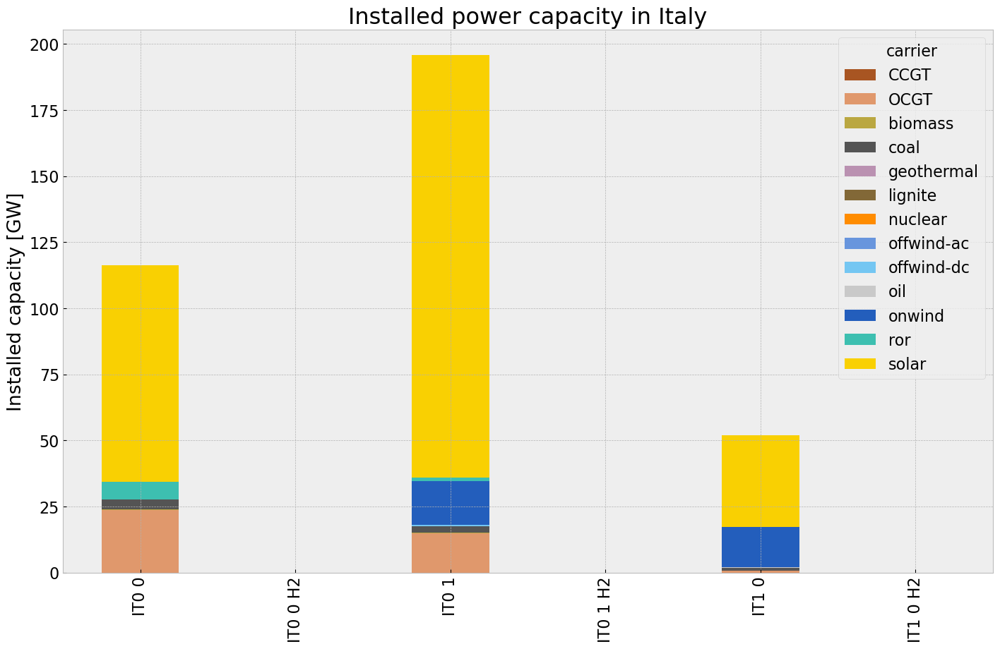

In [173]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

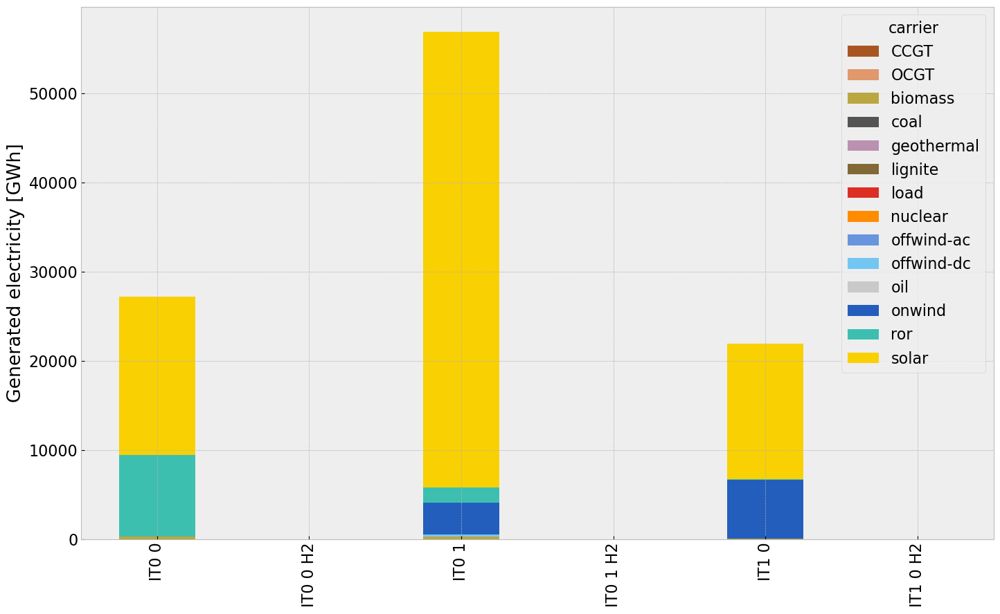

In [174]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

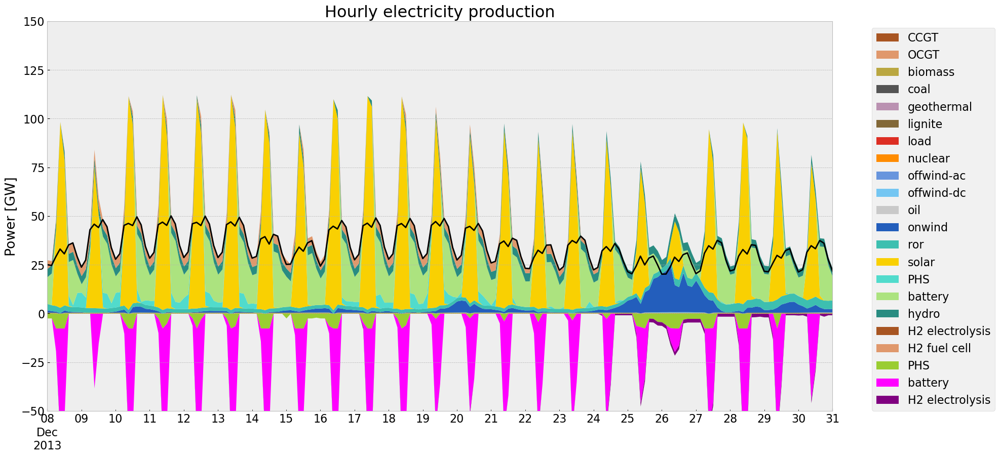

In [175]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

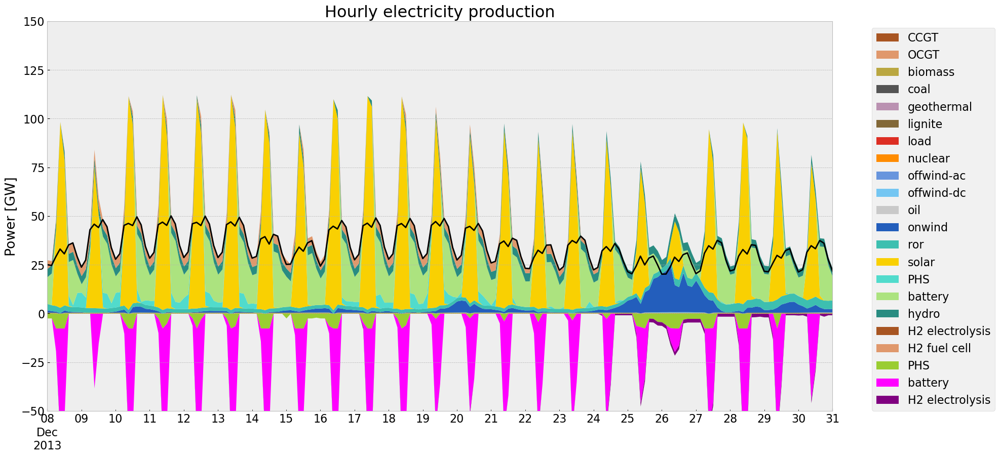

In [176]:
gen_curve(n1, '2013-12-08', '2013-12-31', colors_gen)

## Storage

carrier,PHS,battery,hydro
bus,,,
IT0 0,4.9359,6.478689,3.5108
IT0 1,2.3960,37.323900,0.6060
IT1 0,0.2400,11.000306,0.0780


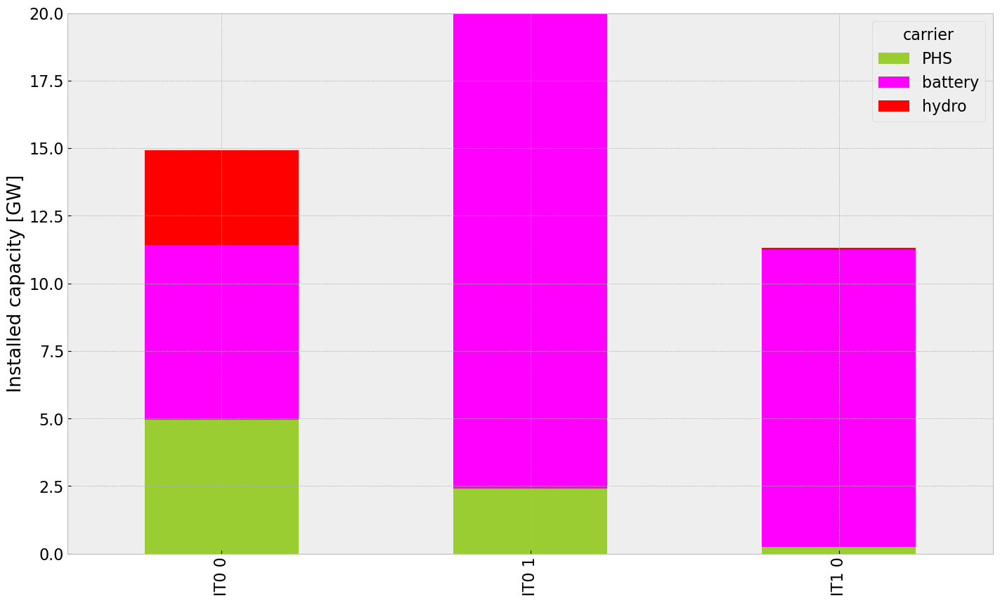

In [177]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)


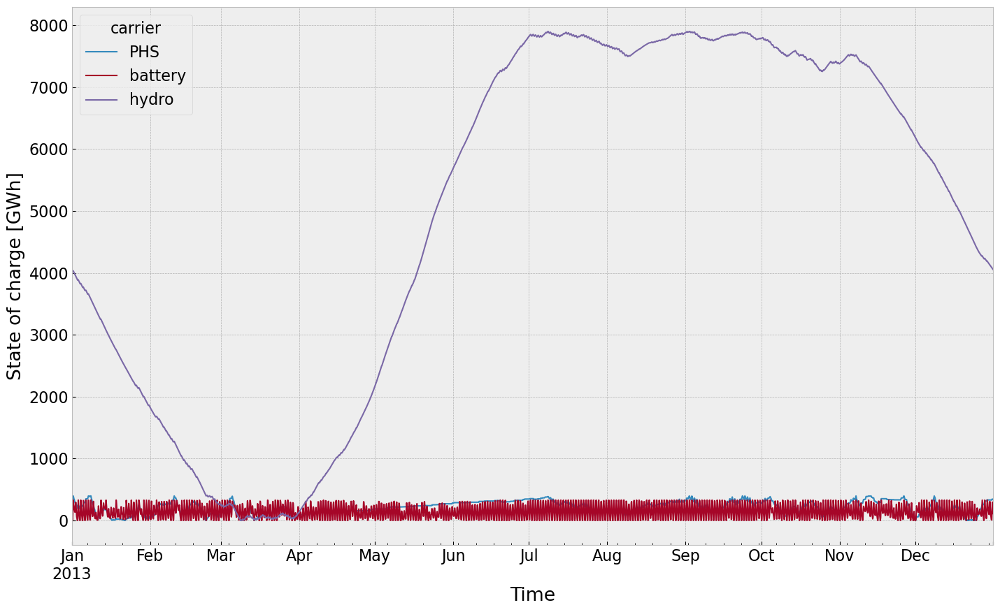

In [178]:
state_of_charge_plot(n1)


## Electricity Price


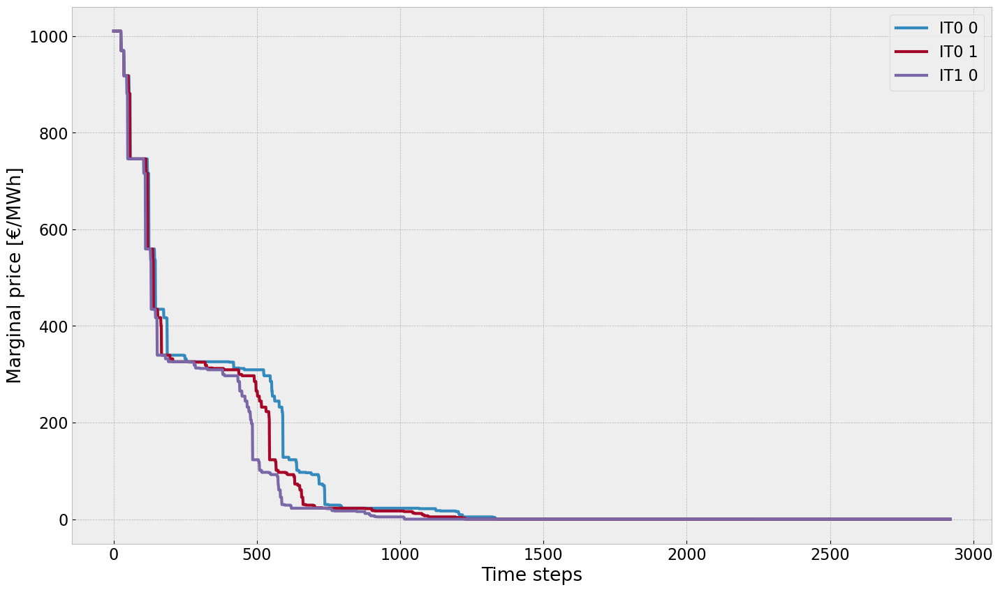

In [179]:
price_dur_curve_plot(n1)



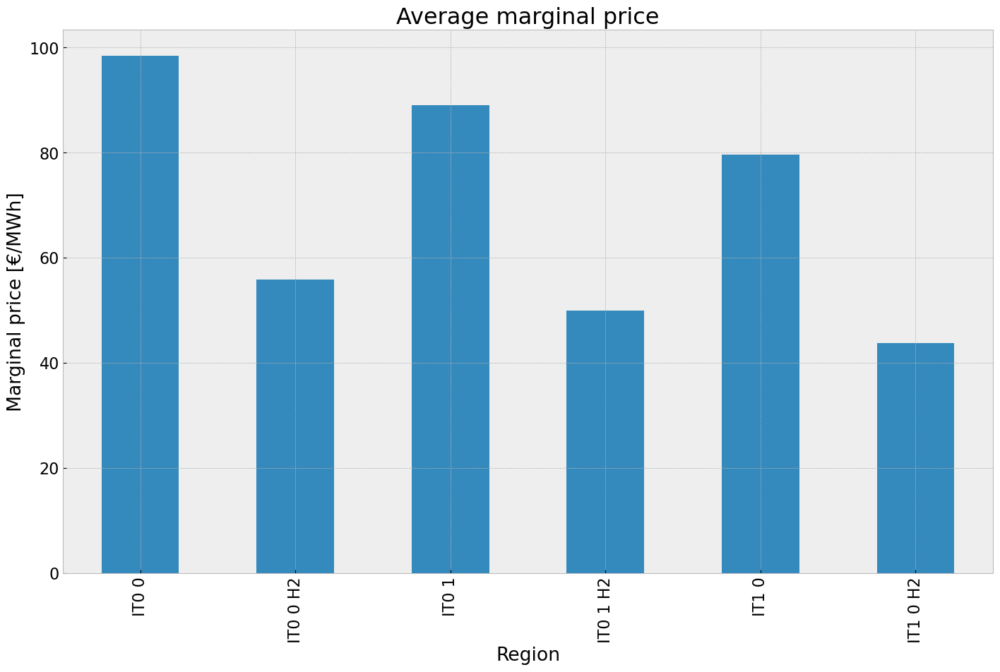

In [180]:
price_regions_table(n1)

## 2. Scenario: perfect foresight with no additional investment

In [181]:
#copy network
n2=n1.copy()

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']

In [182]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,81953.580133,0.0,True,1.0,0.019877,39296.472708,81953.580133,56105.496479,,1.0,1.0,0,0,0,1,0,81953.580133,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,150750.815232,0.0,True,1.0,0.019646,39296.472708,150750.815232,53198.633823,,1.0,1.0,0,0,0,1,0,159856.929648,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,31244.144830,0.0,True,1.0,0.020787,39296.472708,31244.144830,6273.290436,,1.0,1.0,0,0,0,1,0,34867.983311,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


In [183]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [184]:
n2.optimize(solver_name ='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 15/15 [00:00<00:00, 15.51it/s]
INFO:linopy.io: Writing time: 6.4s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zhveifhc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zhveifhc.lp


Reading time = 1.89 seconds


INFO:gurobipy:Reading time = 1.89 seconds


obj: 531489 rows, 256950 columns, 997225 nonzeros


INFO:gurobipy:obj: 531489 rows, 256950 columns, 997225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 531489 rows, 256950 columns and 997225 nonzeros


INFO:gurobipy:Optimize a model with 531489 rows, 256950 columns and 997225 nonzeros


Model fingerprint: 0x3cbfeeac


INFO:gurobipy:Model fingerprint: 0x3cbfeeac


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 455602 rows and 98949 columns


INFO:gurobipy:Presolve removed 455602 rows and 98949 columns


Presolve time: 0.84s


INFO:gurobipy:Presolve time: 0.84s


Presolved: 75887 rows, 158001 columns, 324398 nonzeros


INFO:gurobipy:Presolved: 75887 rows, 158001 columns, 324398 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.08s


INFO:gurobipy:Ordering time: 0.08s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 10


INFO:gurobipy: Dense cols : 10


 AA' NZ     : 1.752e+05


INFO:gurobipy: AA' NZ     : 1.752e+05


 Factor NZ  : 1.383e+06 (roughly 100 MB of memory)


INFO:gurobipy: Factor NZ  : 1.383e+06 (roughly 100 MB of memory)


 Factor Ops : 3.733e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.733e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   8.55612891e+13 -1.65735064e+15  4.48e+06 8.03e+04  4.46e+10     2s


INFO:gurobipy:   0   8.55612891e+13 -1.65735064e+15  4.48e+06 8.03e+04  4.46e+10     2s


   1   5.53806506e+13 -4.35676758e+14  2.26e+06 5.13e+03  1.71e+10     2s


INFO:gurobipy:   1   5.53806506e+13 -4.35676758e+14  2.26e+06 5.13e+03  1.71e+10     2s


   2   4.89102682e+13 -2.57763179e+14  1.83e+06 2.06e+03  1.37e+10     2s


INFO:gurobipy:   2   4.89102682e+13 -2.57763179e+14  1.83e+06 2.06e+03  1.37e+10     2s


   3   2.36968358e+13 -8.95281797e+13  1.50e+05 2.28e+02  1.38e+09     2s


INFO:gurobipy:   3   2.36968358e+13 -8.95281797e+13  1.50e+05 2.28e+02  1.38e+09     2s


   4   5.46002096e+12 -1.70498924e+13  1.06e+03 6.24e+00  7.77e+07     2s


INFO:gurobipy:   4   5.46002096e+12 -1.70498924e+13  1.06e+03 6.24e+00  7.77e+07     2s


   5   7.95553127e+11 -3.48427096e+12  1.46e+02 1.12e+00  1.40e+07     3s


INFO:gurobipy:   5   7.95553127e+11 -3.48427096e+12  1.46e+02 1.12e+00  1.40e+07     3s


   6   5.02184609e+11 -1.15571892e+12  8.65e+01 3.64e-01  5.40e+06     3s


INFO:gurobipy:   6   5.02184609e+11 -1.15571892e+12  8.65e+01 3.64e-01  5.40e+06     3s


   7   3.19926294e+11 -6.77015800e+11  4.95e+01 2.16e-01  3.23e+06     3s


INFO:gurobipy:   7   3.19926294e+11 -6.77015800e+11  4.95e+01 2.16e-01  3.23e+06     3s


   8   2.10489135e+11 -1.83139528e+11  2.94e+01 5.93e-02  1.27e+06     3s


INFO:gurobipy:   8   2.10489135e+11 -1.83139528e+11  2.94e+01 5.93e-02  1.27e+06     3s


   9   1.34510322e+11 -1.02438625e+11  1.74e+01 3.49e-02  7.63e+05     3s


INFO:gurobipy:   9   1.34510322e+11 -1.02438625e+11  1.74e+01 3.49e-02  7.63e+05     3s


  10   9.06823792e+10 -4.18038563e+10  1.06e+01 1.69e-02  4.25e+05     4s


INFO:gurobipy:  10   9.06823792e+10 -4.18038563e+10  1.06e+01 1.69e-02  4.25e+05     4s


  11   6.38899819e+10 -1.56145138e+10  6.52e+00 9.57e-03  2.55e+05     4s


INFO:gurobipy:  11   6.38899819e+10 -1.56145138e+10  6.52e+00 9.57e-03  2.55e+05     4s


  12   5.12124090e+10 -5.38300636e+09  4.57e+00 6.81e-03  1.81e+05     4s


INFO:gurobipy:  12   5.12124090e+10 -5.38300636e+09  4.57e+00 6.81e-03  1.81e+05     4s


  13   4.53786478e+10  3.09604887e+08  3.65e+00 5.32e-03  1.44e+05     4s


INFO:gurobipy:  13   4.53786478e+10  3.09604887e+08  3.65e+00 5.32e-03  1.44e+05     4s


  14   4.26368398e+10  2.43472277e+09  3.21e+00 4.80e-03  1.28e+05     4s


INFO:gurobipy:  14   4.26368398e+10  2.43472277e+09  3.21e+00 4.80e-03  1.28e+05     4s


  15   3.91479851e+10  5.70784206e+09  2.65e+00 4.01e-03  1.07e+05     4s


INFO:gurobipy:  15   3.91479851e+10  5.70784206e+09  2.65e+00 4.01e-03  1.07e+05     4s


  16   3.53076781e+10  9.42754269e+09  2.07e+00 3.07e-03  8.25e+04     5s


INFO:gurobipy:  16   3.53076781e+10  9.42754269e+09  2.07e+00 3.07e-03  8.25e+04     5s


  17   3.15474415e+10  1.48828063e+10  1.49e+00 1.78e-03  5.31e+04     5s


INFO:gurobipy:  17   3.15474415e+10  1.48828063e+10  1.49e+00 1.78e-03  5.31e+04     5s


  18   2.89805638e+10  1.67900735e+10  1.07e+00 1.34e-03  3.88e+04     5s


INFO:gurobipy:  18   2.89805638e+10  1.67900735e+10  1.07e+00 1.34e-03  3.88e+04     5s


  19   2.69395450e+10  1.86184575e+10  7.32e-01 9.15e-04  2.65e+04     5s


INFO:gurobipy:  19   2.69395450e+10  1.86184575e+10  7.32e-01 9.15e-04  2.65e+04     5s


  20   2.56418635e+10  2.01129500e+10  4.99e-01 5.81e-04  1.76e+04     6s


INFO:gurobipy:  20   2.56418635e+10  2.01129500e+10  4.99e-01 5.81e-04  1.76e+04     6s


  21   2.48084866e+10  2.07890888e+10  3.52e-01 4.35e-04  1.28e+04     6s


INFO:gurobipy:  21   2.48084866e+10  2.07890888e+10  3.52e-01 4.35e-04  1.28e+04     6s


  22   2.43350403e+10  2.13905509e+10  2.69e-01 3.08e-04  9.36e+03     6s


INFO:gurobipy:  22   2.43350403e+10  2.13905509e+10  2.69e-01 3.08e-04  9.36e+03     6s


  23   2.39332199e+10  2.17571582e+10  1.96e-01 2.31e-04  6.92e+03     6s


INFO:gurobipy:  23   2.39332199e+10  2.17571582e+10  1.96e-01 2.31e-04  6.92e+03     6s


  24   2.36533030e+10  2.20424126e+10  1.45e-01 1.72e-04  5.12e+03     6s


INFO:gurobipy:  24   2.36533030e+10  2.20424126e+10  1.45e-01 1.72e-04  5.12e+03     6s


  25   2.34595369e+10  2.22399303e+10  1.08e-01 1.32e-04  3.88e+03     7s


INFO:gurobipy:  25   2.34595369e+10  2.22399303e+10  1.08e-01 1.32e-04  3.88e+03     7s


  26   2.33421077e+10  2.24516633e+10  8.46e-02 8.91e-05  2.83e+03     7s


INFO:gurobipy:  26   2.33421077e+10  2.24516633e+10  8.46e-02 8.91e-05  2.83e+03     7s


  27   2.31935609e+10  2.25416950e+10  5.59e-02 7.13e-05  2.07e+03     7s


INFO:gurobipy:  27   2.31935609e+10  2.25416950e+10  5.59e-02 7.13e-05  2.07e+03     7s


  28   2.31666725e+10  2.26269754e+10  5.04e-02 5.47e-05  1.72e+03     7s


INFO:gurobipy:  28   2.31666725e+10  2.26269754e+10  5.04e-02 5.47e-05  1.72e+03     7s


  29   2.31214010e+10  2.26506363e+10  4.14e-02 5.02e-05  1.50e+03     8s


INFO:gurobipy:  29   2.31214010e+10  2.26506363e+10  4.14e-02 5.02e-05  1.50e+03     8s


  30   2.30506004e+10  2.27463687e+10  2.72e-02 3.14e-05  9.67e+02     8s


INFO:gurobipy:  30   2.30506004e+10  2.27463687e+10  2.72e-02 3.14e-05  9.67e+02     8s


  31   2.30130200e+10  2.27918299e+10  1.94e-02 2.30e-05  7.03e+02     8s


INFO:gurobipy:  31   2.30130200e+10  2.27918299e+10  1.94e-02 2.30e-05  7.03e+02     8s


  32   2.29882877e+10  2.28311631e+10  1.44e-02 1.56e-05  4.99e+02     8s


INFO:gurobipy:  32   2.29882877e+10  2.28311631e+10  1.44e-02 1.56e-05  4.99e+02     8s


  33   2.29654255e+10  2.28638605e+10  9.68e-03 9.69e-06  3.23e+02     8s


INFO:gurobipy:  33   2.29654255e+10  2.28638605e+10  9.68e-03 9.69e-06  3.23e+02     8s


  34   2.29519293e+10  2.28828191e+10  6.46e-03 6.28e-06  2.20e+02     9s


INFO:gurobipy:  34   2.29519293e+10  2.28828191e+10  6.46e-03 6.28e-06  2.20e+02     9s


  35   2.29400274e+10  2.28941906e+10  3.80e-03 4.43e-06  1.46e+02     9s


INFO:gurobipy:  35   2.29400274e+10  2.28941906e+10  3.80e-03 4.43e-06  1.46e+02     9s


  36   2.29387216e+10  2.29011134e+10  3.49e-03 3.34e-06  1.19e+02     9s


INFO:gurobipy:  36   2.29387216e+10  2.29011134e+10  3.49e-03 3.34e-06  1.19e+02     9s


  37   2.29347163e+10  2.29049751e+10  2.56e-03 2.74e-06  9.45e+01     9s


INFO:gurobipy:  37   2.29347163e+10  2.29049751e+10  2.56e-03 2.74e-06  9.45e+01     9s


  38   2.29334493e+10  2.29106859e+10  2.27e-03 1.84e-06  7.23e+01     9s


INFO:gurobipy:  38   2.29334493e+10  2.29106859e+10  2.27e-03 1.84e-06  7.23e+01     9s


  39   2.29316553e+10  2.29145353e+10  1.86e-03 1.25e-06  5.44e+01     9s


INFO:gurobipy:  39   2.29316553e+10  2.29145353e+10  1.86e-03 1.25e-06  5.44e+01     9s


  40   2.29275972e+10  2.29178802e+10  9.30e-04 7.82e-07  3.09e+01     9s


INFO:gurobipy:  40   2.29275972e+10  2.29178802e+10  9.30e-04 7.82e-07  3.09e+01     9s


  41   2.29268306e+10  2.29190581e+10  7.59e-04 6.14e-07  2.47e+01    10s


INFO:gurobipy:  41   2.29268306e+10  2.29190581e+10  7.59e-04 6.14e-07  2.47e+01    10s


  42   2.29255031e+10  2.29199402e+10  4.71e-04 4.80e-07  1.77e+01    10s


INFO:gurobipy:  42   2.29255031e+10  2.29199402e+10  4.71e-04 4.80e-07  1.77e+01    10s


  43   2.29248083e+10  2.29212652e+10  3.19e-04 2.82e-07  1.13e+01    10s


INFO:gurobipy:  43   2.29248083e+10  2.29212652e+10  3.19e-04 2.82e-07  1.13e+01    10s


  44   2.29243583e+10  2.29220678e+10  2.25e-04 1.58e-07  7.27e+00    10s


INFO:gurobipy:  44   2.29243583e+10  2.29220678e+10  2.25e-04 1.58e-07  7.27e+00    10s


  45   2.29237701e+10  2.29225387e+10  1.06e-04 9.19e-08  3.91e+00    10s


INFO:gurobipy:  45   2.29237701e+10  2.29225387e+10  1.06e-04 9.19e-08  3.91e+00    10s


  46   2.29236566e+10  2.29227406e+10  8.36e-05 6.36e-08  2.91e+00    10s


INFO:gurobipy:  46   2.29236566e+10  2.29227406e+10  8.36e-05 6.36e-08  2.91e+00    10s


  47   2.29235368e+10  2.29228709e+10  6.00e-05 4.57e-08  2.11e+00    11s


INFO:gurobipy:  47   2.29235368e+10  2.29228709e+10  6.00e-05 4.57e-08  2.11e+00    11s


  48   2.29234340e+10  2.29230024e+10  3.98e-05 2.71e-08  1.37e+00    11s


INFO:gurobipy:  48   2.29234340e+10  2.29230024e+10  3.98e-05 2.71e-08  1.37e+00    11s


  49   2.29233801e+10  2.29230717e+10  2.94e-05 1.81e-08  9.79e-01    11s


INFO:gurobipy:  49   2.29233801e+10  2.29230717e+10  2.94e-05 1.81e-08  9.79e-01    11s


  50   2.29233165e+10  2.29231339e+10  1.77e-05 9.83e-09  5.80e-01    11s


INFO:gurobipy:  50   2.29233165e+10  2.29231339e+10  1.77e-05 9.83e-09  5.80e-01    11s


  51   2.29232943e+10  2.29231720e+10  1.35e-05 5.01e-09  3.88e-01    11s


INFO:gurobipy:  51   2.29232943e+10  2.29231720e+10  1.35e-05 5.01e-09  3.88e-01    11s


  52   2.29232764e+10  2.29231879e+10  1.01e-05 3.80e-09  2.81e-01    11s


INFO:gurobipy:  52   2.29232764e+10  2.29231879e+10  1.01e-05 3.80e-09  2.81e-01    11s


  53   2.29232594e+10  2.29232017e+10  7.01e-06 4.92e-09  1.83e-01    12s


INFO:gurobipy:  53   2.29232594e+10  2.29232017e+10  7.01e-06 4.92e-09  1.83e-01    12s


  54   2.29232462e+10  2.29232095e+10  4.61e-06 5.31e-09  1.16e-01    12s


INFO:gurobipy:  54   2.29232462e+10  2.29232095e+10  4.61e-06 5.31e-09  1.16e-01    12s


  55   2.29232430e+10  2.29232112e+10  4.02e-06 5.29e-09  1.01e-01    12s


INFO:gurobipy:  55   2.29232430e+10  2.29232112e+10  4.02e-06 5.29e-09  1.01e-01    12s


  56   2.29232364e+10  2.29232151e+10  2.82e-06 5.51e-09  6.75e-02    12s


INFO:gurobipy:  56   2.29232364e+10  2.29232151e+10  2.82e-06 5.51e-09  6.75e-02    12s


  57   2.29232319e+10  2.29232175e+10  2.00e-06 5.00e-09  4.58e-02    12s


INFO:gurobipy:  57   2.29232319e+10  2.29232175e+10  2.00e-06 5.00e-09  4.58e-02    12s


  58   2.29232279e+10  2.29232187e+10  1.27e-06 1.51e-08  2.92e-02    12s


INFO:gurobipy:  58   2.29232279e+10  2.29232187e+10  1.27e-06 1.51e-08  2.92e-02    12s


  59   2.29232242e+10  2.29232194e+10  6.65e-07 4.95e-09  1.53e-02    13s


INFO:gurobipy:  59   2.29232242e+10  2.29232194e+10  6.65e-07 4.95e-09  1.53e-02    13s


  60   2.29232235e+10  2.29232199e+10  5.21e-07 3.55e-09  1.16e-02    13s


INFO:gurobipy:  60   2.29232235e+10  2.29232199e+10  5.21e-07 3.55e-09  1.16e-02    13s


  61   2.29232229e+10  2.29232205e+10  4.04e-07 5.45e-10  7.78e-03    13s


INFO:gurobipy:  61   2.29232229e+10  2.29232205e+10  4.04e-07 5.45e-10  7.78e-03    13s


  62   2.29232227e+10  2.29232205e+10  3.69e-07 3.54e-10  6.90e-03    13s


INFO:gurobipy:  62   2.29232227e+10  2.29232205e+10  3.69e-07 3.54e-10  6.90e-03    13s


  63   2.29232211e+10  2.29232207e+10  6.57e-07 2.21e-09  1.27e-03    13s


INFO:gurobipy:  63   2.29232211e+10  2.29232207e+10  6.57e-07 2.21e-09  1.27e-03    13s


  64   2.29232209e+10  2.29232208e+10  3.31e-05 1.22e-09  3.21e-04    14s


INFO:gurobipy:  64   2.29232209e+10  2.29232208e+10  3.31e-05 1.22e-09  3.21e-04    14s


  65   2.29232208e+10  2.29232208e+10  7.24e-05 2.28e-09  1.73e-05    14s


INFO:gurobipy:  65   2.29232208e+10  2.29232208e+10  7.24e-05 2.28e-09  1.73e-05    14s


  66   2.29232208e+10  2.29232208e+10  1.13e-05 1.90e-08  2.23e-08    14s


INFO:gurobipy:  66   2.29232208e+10  2.29232208e+10  1.13e-05 1.90e-08  2.23e-08    14s


  67   2.29232208e+10  2.29232208e+10  2.01e-05 2.33e-09  3.83e-11    14s


INFO:gurobipy:  67   2.29232208e+10  2.29232208e+10  2.01e-05 2.33e-09  3.83e-11    14s


INFO:gurobipy:


Barrier solved model in 67 iterations and 14.18 seconds (4.15 work units)


INFO:gurobipy:Barrier solved model in 67 iterations and 14.18 seconds (4.15 work units)


Optimal objective 2.29232208e+10


INFO:gurobipy:Optimal objective 2.29232208e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


     697 DPushes remaining with DInf 0.0000000e+00                14s


INFO:gurobipy:     697 DPushes remaining with DInf 0.0000000e+00                14s


       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                15s


INFO:gurobipy:Warning: Markowitz tolerance tightened to 0.25


INFO:gurobipy:


   10303 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:   10303 PPushes remaining with PInf 0.0000000e+00                15s


    6025 PPushes remaining with PInf 0.0000000e+00                15s


INFO:gurobipy:    6025 PPushes remaining with PInf 0.0000000e+00                15s


       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                16s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0089160e-08     16s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.0089160e-08     16s


INFO:gurobipy:


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   11003    2.2923221e+10   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:   11003    2.2923221e+10   0.000000e+00   0.000000e+00     16s


INFO:gurobipy:


Solved in 11003 iterations and 16.26 seconds (5.18 work units)


INFO:gurobipy:Solved in 11003 iterations and 16.26 seconds (5.18 work units)


Optimal objective  2.292322080e+10


INFO:gurobipy:Optimal objective  2.292322080e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 256950 primals, 531489 duals
Objective: 2.29e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [185]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

In [186]:
n2.generators[n2.generators['carrier']=='solar']

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,control,p_max_pu,sign,build_year,min_up_time,min_down_time,up_time_before,down_time_before,p_nom_opt,type,p_nom_mod,p_min_pu,p_set,q_set,marginal_cost_quadratic,lifetime,committable,start_up_cost,shut_down_cost,stand_by_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
IT0 0 solar,solar,IT0 0,81953.580133,0.0,True,1.0,0.019877,39296.472708,81953.580133,56105.496479,,1.0,1.0,0,0,0,1,0,81953.580133,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT0 1 solar,solar,IT0 1,150750.815232,0.0,True,1.0,0.019646,39296.472708,150750.815232,53198.633823,,1.0,1.0,0,0,0,1,0,150750.815232,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0
IT1 0 solar,solar,IT1 0,31244.144830,0.0,True,1.0,0.020787,39296.472708,31244.144830,6273.290436,,1.0,1.0,0,0,0,1,0,31244.144830,,0.0,0.0,0.0,0.0,0.0,inf,False,0.0,0.0,0.0,NaN,NaN,1.0,1.0


<Figure size 640x480 with 0 Axes>

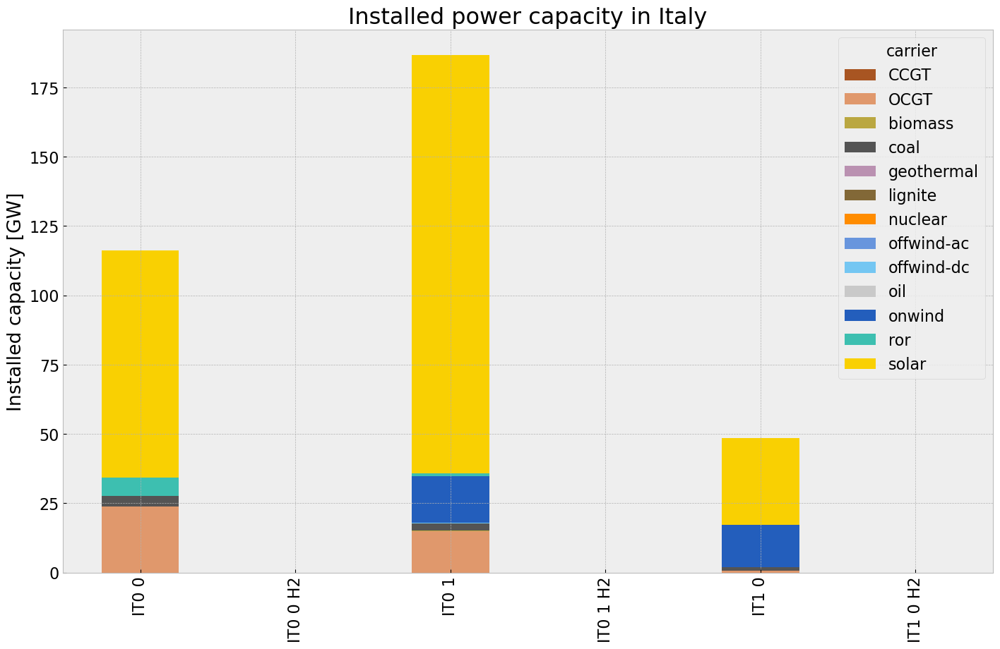

In [187]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

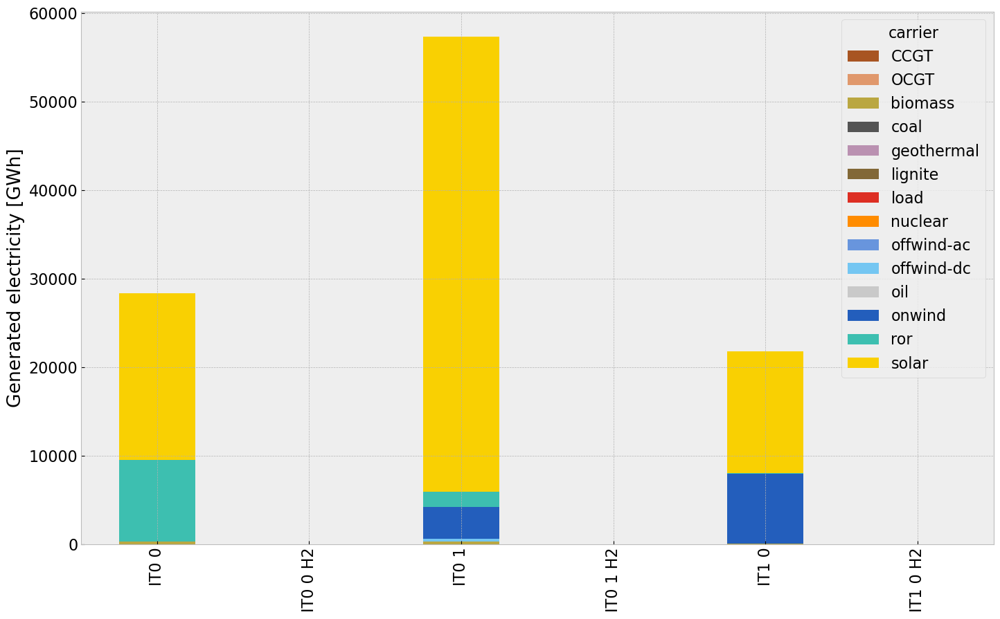

In [188]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2022575680.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2022575680.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier

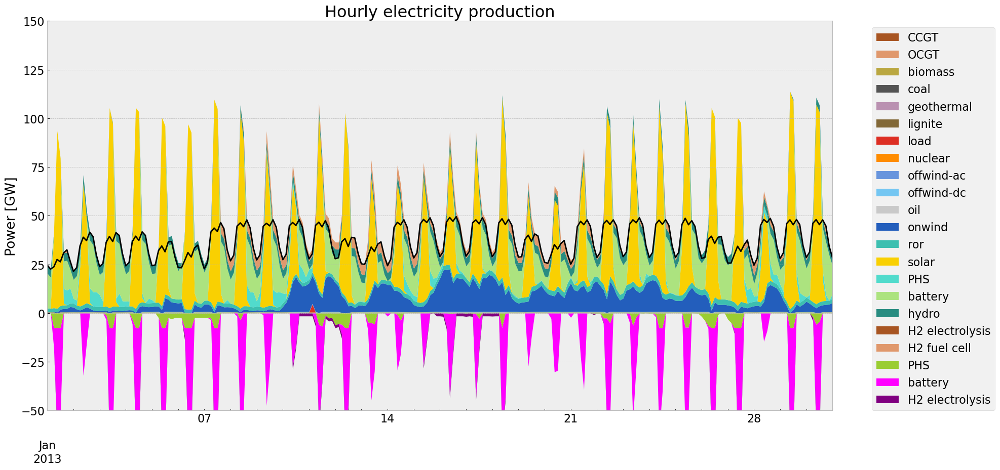

In [189]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2013-01-01', '2013-01-31', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=end_date, freq='

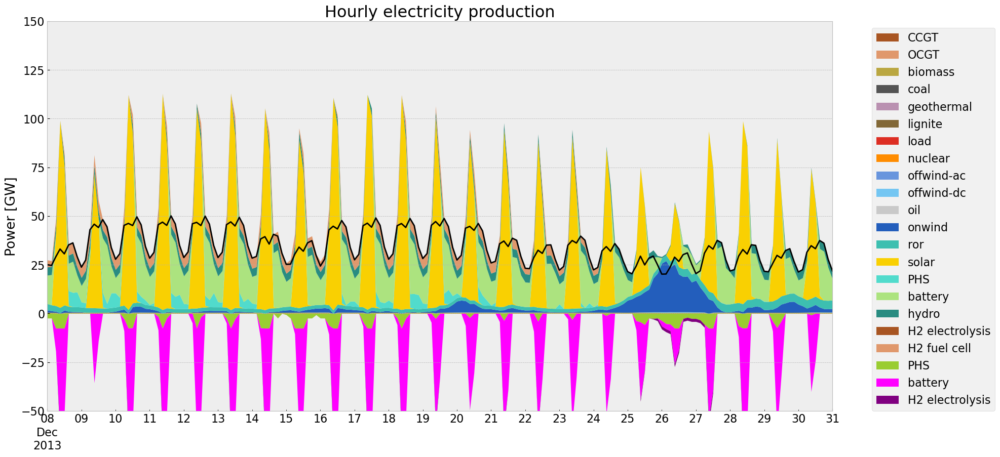

In [190]:
gen_curve(n2, '2013-12-08', '2013-12-31', colors_gen)



C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2765649672.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3374477851.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3374477851.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


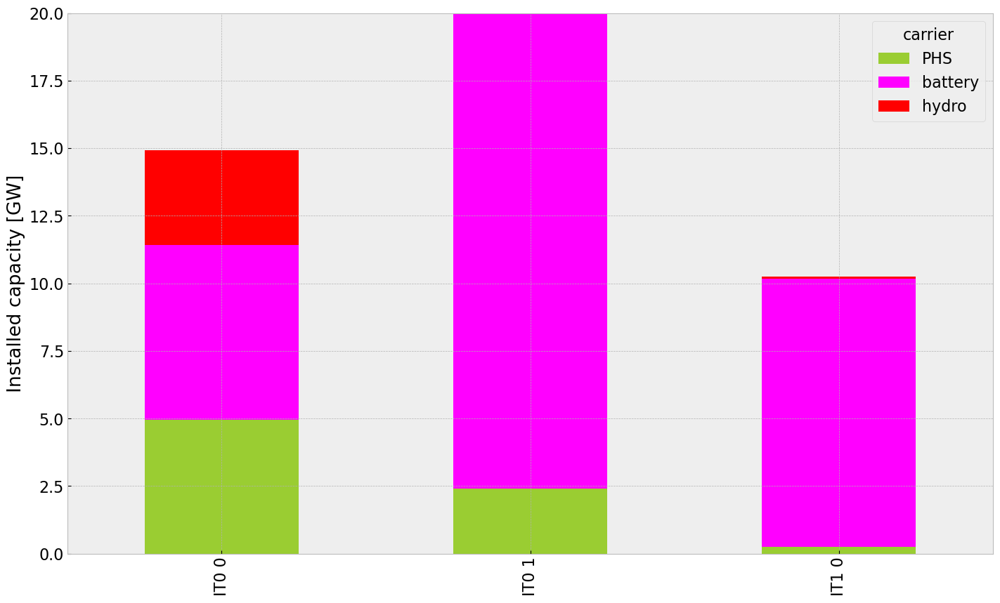

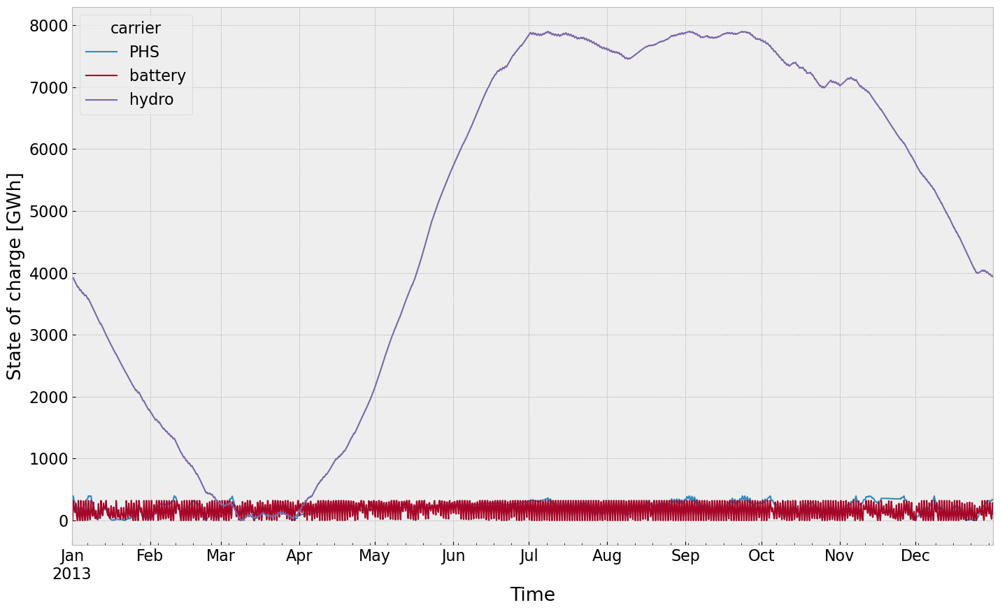

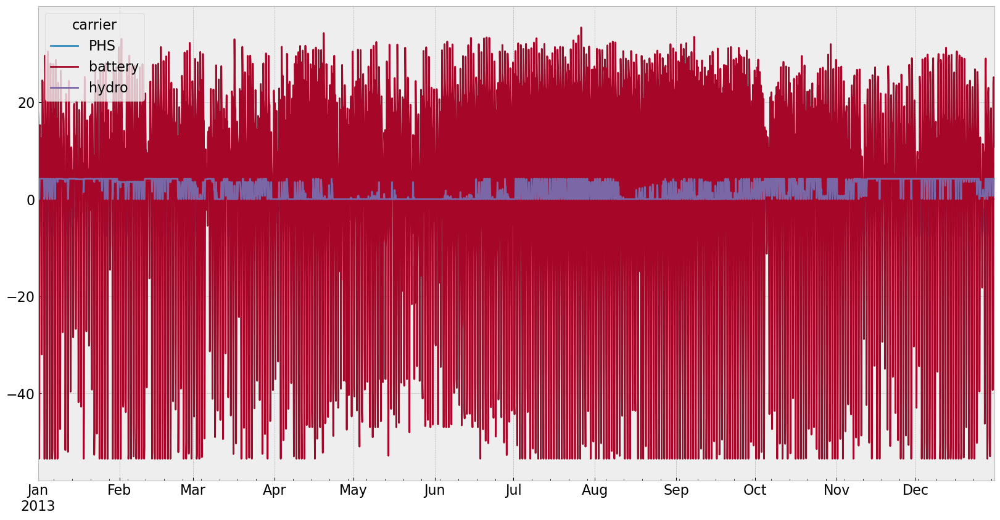

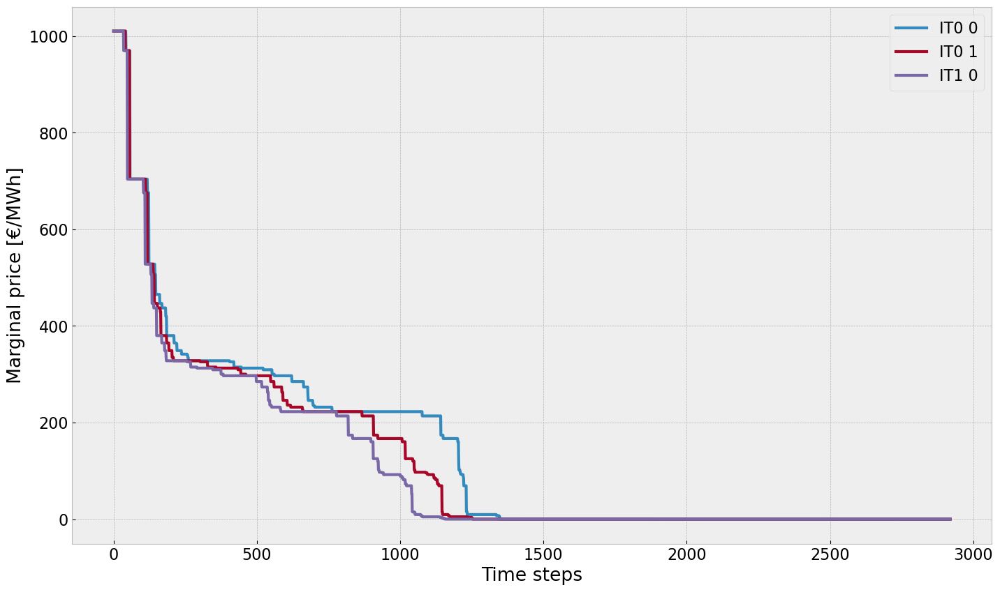

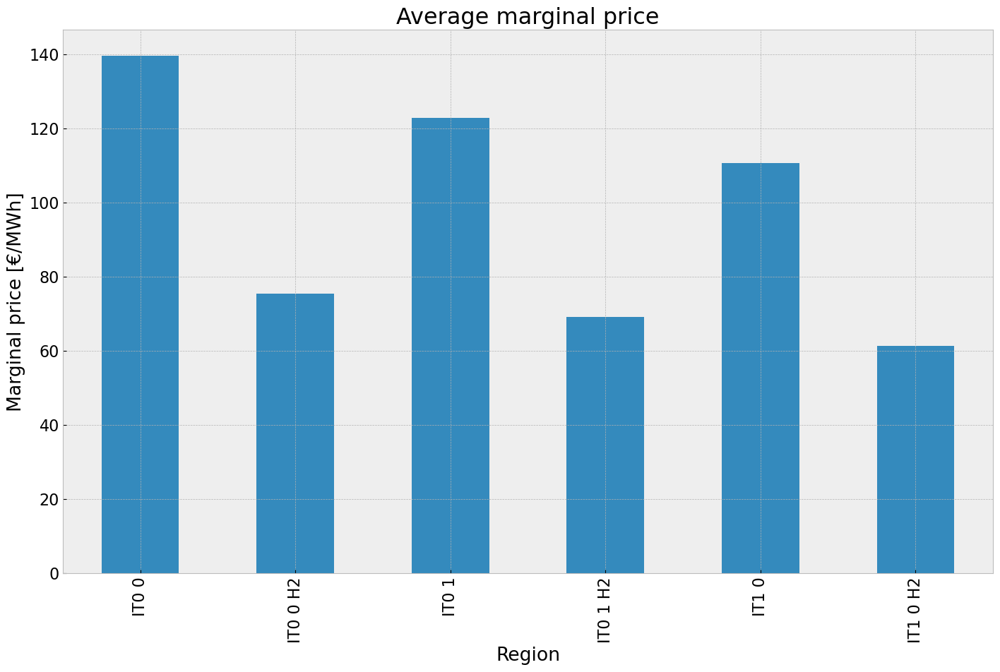

In [191]:
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
price_dur_curve_plot(n2)
price_regions_table(n2)


## 3. Scenario: rolling horizon foresight with no additional investment

In [192]:
n3= n2.copy()
n3.optimize.create_model()

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Store-e_nom (Store-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * Store-e (snapshot, Store)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * Store-p (snapshot, Store)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Store-ext-e_nom-lower (Store-ext)
 * Store-ext-e_nom-upper (Store-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-

In [193]:
optimize.optimize_with_rolling_horizon(n3, horizon=24, overlap=0,
                                       solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lzrqh683.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lzrqh683.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8236 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8236 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8236 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8236 nonzeros


Model fingerprint: 0xff17aab5


INFO:gurobipy:Model fingerprint: 0xff17aab5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 837 columns


INFO:gurobipy:Presolve removed 3793 rows and 837 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     595    1.9645407e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     595    1.9645407e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 595 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 595 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.964540699e+10


INFO:gurobipy:Optimal objective  1.964540699e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jqt5uycs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jqt5uycs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0xcb819cf5


INFO:gurobipy:Model fingerprint: 0xcb819cf5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     618    1.9293147e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     618    1.9293147e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 618 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 618 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.929314653e+10


INFO:gurobipy:Optimal objective  1.929314653e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u39osfm_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u39osfm_.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x0e8218ec


INFO:gurobipy:Model fingerprint: 0x0e8218ec


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 838 columns


INFO:gurobipy:Presolve removed 3793 rows and 838 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1303 columns, 2661 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1303 columns, 2661 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     584    1.9937878e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     584    1.9937878e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 584 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 584 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.993787760e+10


INFO:gurobipy:Optimal objective  1.993787760e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-256y5jt9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-256y5jt9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8248 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8248 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8248 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8248 nonzeros


Model fingerprint: 0xc40d0063


INFO:gurobipy:Model fingerprint: 0xc40d0063


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.01s


INFO:gurobipy:Presolve time: 0.01s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     602    2.0072481e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     602    2.0072481e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 602 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 602 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.007248108e+10


INFO:gurobipy:Optimal objective  2.007248108e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f7ne2wwb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f7ne2wwb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0xf5abdbf8


INFO:gurobipy:Model fingerprint: 0xf5abdbf8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     585    2.0281317e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     585    2.0281317e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 585 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 585 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.028131713e+10


INFO:gurobipy:Optimal objective  2.028131713e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.03e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sky7s02y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sky7s02y.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0xb090f841


INFO:gurobipy:Model fingerprint: 0xb090f841


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     542    2.0041187e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     542    2.0041187e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 542 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 542 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.004118706e+10


INFO:gurobipy:Optimal objective  2.004118706e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.00e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p09ipck_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p09ipck_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xc34d0b72


INFO:gurobipy:Model fingerprint: 0xc34d0b72


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     579    2.0081352e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     579    2.0081352e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 579 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 579 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.008135228e+10


INFO:gurobipy:Optimal objective  2.008135228e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1uy9p1k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s1uy9p1k.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x87621997


INFO:gurobipy:Model fingerprint: 0x87621997


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     548    1.9829267e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     548    1.9829267e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 548 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 548 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.982926672e+10


INFO:gurobipy:Optimal objective  1.982926672e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.98e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w4g7tfft.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w4g7tfft.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x9a1a5bd8


INFO:gurobipy:Model fingerprint: 0x9a1a5bd8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     616    1.9404386e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     616    1.9404386e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 616 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 616 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.940438600e+10


INFO:gurobipy:Optimal objective  1.940438600e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7hwkm__4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7hwkm__4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8251 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8251 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


Model fingerprint: 0xdd19631f


INFO:gurobipy:Model fingerprint: 0xdd19631f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     695    2.0073028e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     695    2.0073028e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 695 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 695 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.007302769e+10


INFO:gurobipy:Optimal objective  2.007302769e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qyaemxde.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qyaemxde.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x8df5cb7f


INFO:gurobipy:Model fingerprint: 0x8df5cb7f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     634    1.9557071e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     634    1.9557071e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 634 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 634 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.955707106e+10


INFO:gurobipy:Optimal objective  1.955707106e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-80nlgpvb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-80nlgpvb.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x82a6ac0f


INFO:gurobipy:Model fingerprint: 0x82a6ac0f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     703    1.9426069e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     703    1.9426069e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 703 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 703 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.942606949e+10


INFO:gurobipy:Optimal objective  1.942606949e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yk1jd8u6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yk1jd8u6.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0xc5346351


INFO:gurobipy:Model fingerprint: 0xc5346351


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     585    1.9710786e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     585    1.9710786e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 585 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 585 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.971078644e+10


INFO:gurobipy:Optimal objective  1.971078644e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0n1wa7e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-h0n1wa7e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0x0743a594


INFO:gurobipy:Model fingerprint: 0x0743a594


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     582    1.9617418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     582    1.9617418e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 582 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 582 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.961741827e+10


INFO:gurobipy:Optimal objective  1.961741827e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-09p_39bl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-09p_39bl.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0xbcebf65e


INFO:gurobipy:Model fingerprint: 0xbcebf65e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     574    1.9943111e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     574    1.9943111e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 574 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 574 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.994311090e+10


INFO:gurobipy:Optimal objective  1.994311090e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6euvvk52.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6euvvk52.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8239 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8239 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


Model fingerprint: 0x7989bb81


INFO:gurobipy:Model fingerprint: 0x7989bb81


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 839 columns


INFO:gurobipy:Presolve removed 3793 rows and 839 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     652    1.9391081e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     652    1.9391081e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 652 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 652 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.939108146e+10


INFO:gurobipy:Optimal objective  1.939108146e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y3b0weis.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y3b0weis.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8251 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8251 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8251 nonzeros


Model fingerprint: 0xfceee2f2


INFO:gurobipy:Model fingerprint: 0xfceee2f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     588    1.9705033e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     588    1.9705033e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 588 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 588 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.970503316e+10


INFO:gurobipy:Optimal objective  1.970503316e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b7r86z4d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b7r86z4d.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x09e3eb71


INFO:gurobipy:Model fingerprint: 0x09e3eb71


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     564    1.9925062e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     564    1.9925062e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 564 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 564 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.992506152e+10


INFO:gurobipy:Optimal objective  1.992506152e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.25s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttq3fihp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ttq3fihp.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0x42504138


INFO:gurobipy:Model fingerprint: 0x42504138


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     589    1.9562843e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     589    1.9562843e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 589 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 589 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.956284335e+10


INFO:gurobipy:Optimal objective  1.956284335e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lf0mwzgp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lf0mwzgp.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8253 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8253 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8253 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8253 nonzeros


Model fingerprint: 0x27c861dc


INFO:gurobipy:Model fingerprint: 0x27c861dc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     612    1.9497416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     612    1.9497416e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 612 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 612 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.949741625e+10


INFO:gurobipy:Optimal objective  1.949741625e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-41qg8ash.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-41qg8ash.lp


Reading time = 0.01 seconds


INFO:gurobipy:Reading time = 0.01 seconds


obj: 4417 rows, 2141 columns, 8240 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8240 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


Model fingerprint: 0x1e738562


INFO:gurobipy:Model fingerprint: 0x1e738562


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     548    1.9241769e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     548    1.9241769e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 548 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 548 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.924176865e+10


INFO:gurobipy:Optimal objective  1.924176865e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5d_wokj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5d_wokj.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0x59a9e2b3


INFO:gurobipy:Model fingerprint: 0x59a9e2b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.01s


INFO:gurobipy:Presolve time: 0.01s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     608    2.0161456e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     608    2.0161456e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 608 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 608 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.016145623e+10


INFO:gurobipy:Optimal objective  2.016145623e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mkf86lnp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mkf86lnp.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0xd6f4deaf


INFO:gurobipy:Model fingerprint: 0xd6f4deaf


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     662    1.9358003e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     662    1.9358003e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 662 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 662 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.935800340e+10


INFO:gurobipy:Optimal objective  1.935800340e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vp667wwe.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vp667wwe.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8249 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8249 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


Model fingerprint: 0xde86dd9e


INFO:gurobipy:Model fingerprint: 0xde86dd9e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     574    1.9416543e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     574    1.9416543e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 574 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 574 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.941654294e+10


INFO:gurobipy:Optimal objective  1.941654294e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i356vel.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_i356vel.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0x3b81914d


INFO:gurobipy:Model fingerprint: 0x3b81914d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    1.9226823e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    1.9226823e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922682274e+10


INFO:gurobipy:Optimal objective  1.922682274e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ilkovff.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ilkovff.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x3511127e


INFO:gurobipy:Model fingerprint: 0x3511127e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     518    1.9227220e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     518    1.9227220e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 518 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 518 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922722007e+10


INFO:gurobipy:Optimal objective  1.922722007e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c2b7ycp3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c2b7ycp3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x3181a7d7


INFO:gurobipy:Model fingerprint: 0x3181a7d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     517    1.9226967e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     517    1.9226967e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 517 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 517 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922696724e+10


INFO:gurobipy:Optimal objective  1.922696724e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fh5eubch.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-fh5eubch.lp


Reading time = 0.01 seconds


INFO:gurobipy:Reading time = 0.01 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0xff61e30a


INFO:gurobipy:Model fingerprint: 0xff61e30a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     511    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     511    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 511 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 511 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922681663e+10


INFO:gurobipy:Optimal objective  1.922681663e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ktly1gzy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ktly1gzy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8265 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8265 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8265 nonzeros


Model fingerprint: 0x0f723e30


INFO:gurobipy:Model fingerprint: 0x0f723e30


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     537    1.9553867e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     537    1.9553867e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 537 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 537 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.955386661e+10


INFO:gurobipy:Optimal objective  1.955386661e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t0qnx2go.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t0qnx2go.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x3bdebe75


INFO:gurobipy:Model fingerprint: 0x3bdebe75


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.922680960e+10


INFO:gurobipy:Optimal objective  1.922680960e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wn_ccv3_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wn_ccv3_.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0x2f04d286


INFO:gurobipy:Model fingerprint: 0x2f04d286


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.9226811e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.9226811e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681147e+10


INFO:gurobipy:Optimal objective  1.922681147e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wy6pq4jr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wy6pq4jr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0xed596a1c


INFO:gurobipy:Model fingerprint: 0xed596a1c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681567e+10


INFO:gurobipy:Optimal objective  1.922681567e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nyrxvv1v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nyrxvv1v.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8268 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8268 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8268 nonzeros


Model fingerprint: 0x14180720


INFO:gurobipy:Model fingerprint: 0x14180720


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     411    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     411    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 411 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 411 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681330e+10


INFO:gurobipy:Optimal objective  1.922681330e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-du1umsbw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-du1umsbw.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0xeaff2638


INFO:gurobipy:Model fingerprint: 0xeaff2638


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    1.9226819e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    1.9226819e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681906e+10


INFO:gurobipy:Optimal objective  1.922681906e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jhpptwuh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jhpptwuh.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0xceb8976f


INFO:gurobipy:Model fingerprint: 0xceb8976f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922680967e+10


INFO:gurobipy:Optimal objective  1.922680967e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uscxn16t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uscxn16t.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0x507e4815


INFO:gurobipy:Model fingerprint: 0x507e4815


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 850 columns


INFO:gurobipy:Presolve removed 3793 rows and 850 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1291 columns, 2649 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1291 columns, 2649 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    1.9226818e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    1.9226818e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681780e+10


INFO:gurobipy:Optimal objective  1.922681780e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6us9wk13.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6us9wk13.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8254 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8254 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


Model fingerprint: 0x4b133025


INFO:gurobipy:Model fingerprint: 0x4b133025


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     423    1.9226808e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     423    1.9226808e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 423 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 423 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680837e+10


INFO:gurobipy:Optimal objective  1.922680837e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2p_p69zg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2p_p69zg.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8241 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8241 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


Model fingerprint: 0x36ae58b3


INFO:gurobipy:Model fingerprint: 0x36ae58b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     445    1.9226815e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     445    1.9226815e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 445 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 445 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681468e+10


INFO:gurobipy:Optimal objective  1.922681468e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5j0hgm7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b5j0hgm7.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8259 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8259 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8259 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8259 nonzeros


Model fingerprint: 0xf39a6b98


INFO:gurobipy:Model fingerprint: 0xf39a6b98


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     409    1.9226804e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     409    1.9226804e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 409 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 409 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922680394e+10


INFO:gurobipy:Optimal objective  1.922680394e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o32kkovw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-o32kkovw.lp


Reading time = 0.01 seconds


INFO:gurobipy:Reading time = 0.01 seconds


obj: 4417 rows, 2141 columns, 8270 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8270 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8270 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8270 nonzeros


Model fingerprint: 0x78fe38dd


INFO:gurobipy:Model fingerprint: 0x78fe38dd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680630e+10


INFO:gurobipy:Optimal objective  1.922680630e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-clo_l9yb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-clo_l9yb.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8231 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8231 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8231 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8231 nonzeros


Model fingerprint: 0xe3b58215


INFO:gurobipy:Model fingerprint: 0xe3b58215


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     358    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     358    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 358 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 358 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922680631e+10


INFO:gurobipy:Optimal objective  1.922680631e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-186vyv_n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-186vyv_n.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8256 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8256 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8256 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8256 nonzeros


Model fingerprint: 0xa99af6b7


INFO:gurobipy:Model fingerprint: 0xa99af6b7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     385    1.9226805e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     385    1.9226805e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 385 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 385 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680474e+10


INFO:gurobipy:Optimal objective  1.922680474e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j7vl9c_g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j7vl9c_g.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8222 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8222 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


Model fingerprint: 0x28c29db2


INFO:gurobipy:Model fingerprint: 0x28c29db2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681416e+10


INFO:gurobipy:Optimal objective  1.922681416e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zbo2v0u9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zbo2v0u9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0x0e0cd8a2


INFO:gurobipy:Model fingerprint: 0x0e0cd8a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     351    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     351    1.9226806e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 351 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 351 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680600e+10


INFO:gurobipy:Optimal objective  1.922680600e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j41fy7yq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j41fy7yq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0x5f4e8f77


INFO:gurobipy:Model fingerprint: 0x5f4e8f77


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681328e+10


INFO:gurobipy:Optimal objective  1.922681328e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-envfuey2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-envfuey2.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0x9a902d9e


INFO:gurobipy:Model fingerprint: 0x9a902d9e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 820 columns


INFO:gurobipy:Presolve removed 3793 rows and 820 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1321 columns, 2679 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1321 columns, 2679 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     352    1.9226811e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     352    1.9226811e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 352 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 352 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681065e+10


INFO:gurobipy:Optimal objective  1.922681065e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nh6cch1y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nh6cch1y.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8273 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8273 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


Model fingerprint: 0xf33112a6


INFO:gurobipy:Model fingerprint: 0xf33112a6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+02, 2e+09]


INFO:gurobipy:  Bounds range     [1e+02, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     377    1.9226808e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     377    1.9226808e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 377 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 377 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680779e+10


INFO:gurobipy:Optimal objective  1.922680779e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3nzjpi8a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3nzjpi8a.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8276 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8276 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8276 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8276 nonzeros


Model fingerprint: 0x4cb65b2a


INFO:gurobipy:Model fingerprint: 0x4cb65b2a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [9e+01, 2e+09]


INFO:gurobipy:  Bounds range     [9e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 815 columns


INFO:gurobipy:Presolve removed 3793 rows and 815 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     323    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     323    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 323 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 323 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.922681268e+10


INFO:gurobipy:Optimal objective  1.922681268e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bw6etsto.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bw6etsto.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8273 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8273 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8273 nonzeros


Model fingerprint: 0xf6357536


INFO:gurobipy:Model fingerprint: 0xf6357536


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+01, 2e+09]


INFO:gurobipy:  Bounds range     [8e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 819 columns


INFO:gurobipy:Presolve removed 3793 rows and 819 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     447    1.9226804e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     447    1.9226804e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 447 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 447 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922680427e+10


INFO:gurobipy:Optimal objective  1.922680427e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uqcw_u24.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-uqcw_u24.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8275 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8275 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8275 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8275 nonzeros


Model fingerprint: 0xe5857f9a


INFO:gurobipy:Model fingerprint: 0xe5857f9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     428    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     428    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 428 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 428 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681310e+10


INFO:gurobipy:Optimal objective  1.922681310e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cstjsaom.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cstjsaom.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0x57de44b9


INFO:gurobipy:Model fingerprint: 0x57de44b9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 815 columns


INFO:gurobipy:Presolve removed 3793 rows and 815 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1326 columns, 2684 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     434    1.9226805e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     434    1.9226805e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 434 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 434 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922680473e+10


INFO:gurobipy:Optimal objective  1.922680473e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3p2ss_od.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3p2ss_od.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8218 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8218 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


Model fingerprint: 0xbd95b636


INFO:gurobipy:Model fingerprint: 0xbd95b636


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681368e+10


INFO:gurobipy:Optimal objective  1.922681368e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-948vux94.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-948vux94.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8221 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8221 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8221 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8221 nonzeros


Model fingerprint: 0x1df74f57


INFO:gurobipy:Model fingerprint: 0x1df74f57


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681261e+10


INFO:gurobipy:Optimal objective  1.922681261e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hbqv_mpc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hbqv_mpc.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x6ace132e


INFO:gurobipy:Model fingerprint: 0x6ace132e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 819 columns


INFO:gurobipy:Presolve removed 3793 rows and 819 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1322 columns, 2680 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     468    1.9226809e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     468    1.9226809e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 468 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 468 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922680944e+10


INFO:gurobipy:Optimal objective  1.922680944e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p0wwfz9n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p0wwfz9n.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8241 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8241 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8241 nonzeros


Model fingerprint: 0x2a0bfc37


INFO:gurobipy:Model fingerprint: 0x2a0bfc37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [7e+01, 2e+09]


INFO:gurobipy:  Bounds range     [7e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     444    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     444    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 444 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 444 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681726e+10


INFO:gurobipy:Optimal objective  1.922681726e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a7fyv559.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a7fyv559.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x5e604042


INFO:gurobipy:Model fingerprint: 0x5e604042


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 841 columns


INFO:gurobipy:Presolve removed 3793 rows and 841 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     502    1.9226812e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     502    1.9226812e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 502 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 502 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681208e+10


INFO:gurobipy:Optimal objective  1.922681208e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8xa8ku3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-m8xa8ku3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8226 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8226 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8226 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8226 nonzeros


Model fingerprint: 0x2b4e5a38


INFO:gurobipy:Model fingerprint: 0x2b4e5a38


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 837 columns


INFO:gurobipy:Presolve removed 3793 rows and 837 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1304 columns, 2662 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     509    1.9226828e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     509    1.9226828e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 509 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 509 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.922682824e+10


INFO:gurobipy:Optimal objective  1.922682824e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9s6nvaub.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9s6nvaub.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8271 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8271 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8271 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8271 nonzeros


Model fingerprint: 0x62a0e43f


INFO:gurobipy:Model fingerprint: 0x62a0e43f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [6e+01, 2e+09]


INFO:gurobipy:  Bounds range     [6e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 821 columns


INFO:gurobipy:Presolve removed 3793 rows and 821 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1320 columns, 2678 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1320 columns, 2678 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     470    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     470    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 470 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 470 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681636e+10


INFO:gurobipy:Optimal objective  1.922681636e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ozutixrw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ozutixrw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8272 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8272 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8272 nonzeros


Model fingerprint: 0x7229aecc


INFO:gurobipy:Model fingerprint: 0x7229aecc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 817 columns


INFO:gurobipy:Presolve removed 3793 rows and 817 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1324 columns, 2682 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     430    1.9226820e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     430    1.9226820e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 430 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 430 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922682034e+10


INFO:gurobipy:Optimal objective  1.922682034e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cz6e0kxs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cz6e0kxs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x93c752fa


INFO:gurobipy:Model fingerprint: 0x93c752fa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [5e+01, 2e+09]


INFO:gurobipy:  Bounds range     [5e+01, 2e+09]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 822 columns


INFO:gurobipy:Presolve removed 3793 rows and 822 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1319 columns, 2677 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681653e+10


INFO:gurobipy:Optimal objective  1.922681653e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x03pduiw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x03pduiw.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8238 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8238 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8238 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8238 nonzeros


Model fingerprint: 0x33ff4a3e


INFO:gurobipy:Model fingerprint: 0x33ff4a3e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    1.9226817e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681738e+10


INFO:gurobipy:Optimal objective  1.922681738e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htq1usc4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-htq1usc4.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8252 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8252 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8252 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8252 nonzeros


Model fingerprint: 0xf9d91ce8


INFO:gurobipy:Model fingerprint: 0xf9d91ce8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    1.9226827e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    1.9226827e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922682749e+10


INFO:gurobipy:Optimal objective  1.922682749e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qfwor5h4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qfwor5h4.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xd54fcfb3


INFO:gurobipy:Model fingerprint: 0xd54fcfb3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     538    1.9226819e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     538    1.9226819e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 538 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 538 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681943e+10


INFO:gurobipy:Optimal objective  1.922681943e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipgt9dxn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipgt9dxn.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0x8d2ebe36


INFO:gurobipy:Model fingerprint: 0x8d2ebe36


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     625    1.9270233e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     625    1.9270233e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 625 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 625 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.927023287e+10


INFO:gurobipy:Optimal objective  1.927023287e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ejfglhh8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ejfglhh8.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8214 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8214 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8214 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8214 nonzeros


Model fingerprint: 0x21648f69


INFO:gurobipy:Model fingerprint: 0x21648f69


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 847 columns


INFO:gurobipy:Presolve removed 3793 rows and 847 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1294 columns, 2652 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1294 columns, 2652 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922682183e+10


INFO:gurobipy:Optimal objective  1.922682183e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a05keg0c.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a05keg0c.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8235 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8235 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


Model fingerprint: 0xb3b69c25


INFO:gurobipy:Model fingerprint: 0xb3b69c25


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     509    1.9226832e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     509    1.9226832e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 509 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 509 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922683184e+10


INFO:gurobipy:Optimal objective  1.922683184e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zzlquswq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zzlquswq.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8197 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8197 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8197 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8197 nonzeros


Model fingerprint: 0xe068ba8e


INFO:gurobipy:Model fingerprint: 0xe068ba8e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 845 columns


INFO:gurobipy:Presolve removed 3793 rows and 845 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     595    1.9248450e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     595    1.9248450e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 595 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 595 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.924844974e+10


INFO:gurobipy:Optimal objective  1.924844974e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mkk9rgss.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mkk9rgss.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 4417 rows, 2141 columns, 8229 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8229 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


Model fingerprint: 0x3a2e9e45


INFO:gurobipy:Model fingerprint: 0x3a2e9e45


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    1.9226827e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    1.9226827e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922682715e+10


INFO:gurobipy:Optimal objective  1.922682715e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4e_wmxv_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4e_wmxv_.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8191 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8191 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8191 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8191 nonzeros


Model fingerprint: 0xb372e067


INFO:gurobipy:Model fingerprint: 0xb372e067


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 854 columns


INFO:gurobipy:Presolve removed 3793 rows and 854 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1287 columns, 2645 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1287 columns, 2645 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     609    1.9368065e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     609    1.9368065e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 609 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 609 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.936806482e+10


INFO:gurobipy:Optimal objective  1.936806482e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jd4k9ghm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jd4k9ghm.lp


Reading time = 0.01 seconds


INFO:gurobipy:Reading time = 0.01 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0x45023d9d


INFO:gurobipy:Model fingerprint: 0x45023d9d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     662    1.9299063e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     662    1.9299063e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 662 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 662 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.929906287e+10


INFO:gurobipy:Optimal objective  1.929906287e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ocoz00b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6ocoz00b.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x176df244


INFO:gurobipy:Model fingerprint: 0x176df244


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     543    1.9226833e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     543    1.9226833e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 543 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 543 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922683320e+10


INFO:gurobipy:Optimal objective  1.922683320e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kvwkfwu1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kvwkfwu1.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8207 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8207 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8207 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8207 nonzeros


Model fingerprint: 0x59539bd6


INFO:gurobipy:Model fingerprint: 0x59539bd6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     488    1.9226826e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     488    1.9226826e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 488 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 488 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922682579e+10


INFO:gurobipy:Optimal objective  1.922682579e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vn94keba.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vn94keba.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8215 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8215 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


Model fingerprint: 0xb8b7746a


INFO:gurobipy:Model fingerprint: 0xb8b7746a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 849 columns


INFO:gurobipy:Presolve removed 3793 rows and 849 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1292 columns, 2650 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1292 columns, 2650 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     666    1.9336629e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     666    1.9336629e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 666 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 666 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.933662946e+10


INFO:gurobipy:Optimal objective  1.933662946e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nmklnb5_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nmklnb5_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0x7915a144


INFO:gurobipy:Model fingerprint: 0x7915a144


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     498    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     498    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 498 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 498 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922682231e+10


INFO:gurobipy:Optimal objective  1.922682231e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mulk1ar0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mulk1ar0.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8209 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8209 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8209 nonzeros


Model fingerprint: 0x5671e29e


INFO:gurobipy:Model fingerprint: 0x5671e29e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 853 columns


INFO:gurobipy:Presolve removed 3793 rows and 853 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1288 columns, 2646 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1288 columns, 2646 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    1.9226813e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681327e+10


INFO:gurobipy:Optimal objective  1.922681327e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49b6og3m.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49b6og3m.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0x6fd4fef5


INFO:gurobipy:Model fingerprint: 0x6fd4fef5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     469    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     469    1.9226810e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 469 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 469 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681020e+10


INFO:gurobipy:Optimal objective  1.922681020e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ep9aszw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ep9aszw.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0xb9589137


INFO:gurobipy:Model fingerprint: 0xb9589137


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 851 columns


INFO:gurobipy:Presolve removed 3793 rows and 851 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    1.9226814e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681392e+10


INFO:gurobipy:Optimal objective  1.922681392e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.33s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yfb3y5kc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yfb3y5kc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8260 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8260 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8260 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8260 nonzeros


Model fingerprint: 0x97c48292


INFO:gurobipy:Model fingerprint: 0x97c48292


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     512    1.9226818e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     512    1.9226818e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 512 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 512 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681817e+10


INFO:gurobipy:Optimal objective  1.922681817e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mzvecf3k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mzvecf3k.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8225 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8225 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8225 nonzeros


Model fingerprint: 0x8471ba77


INFO:gurobipy:Model fingerprint: 0x8471ba77


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922681565e+10


INFO:gurobipy:Optimal objective  1.922681565e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b1wm416n.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b1wm416n.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8242 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8242 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8242 nonzeros


Model fingerprint: 0x0aa3303f


INFO:gurobipy:Model fingerprint: 0x0aa3303f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    1.9226823e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    1.9226823e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922682341e+10


INFO:gurobipy:Optimal objective  1.922682341e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-np40666z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-np40666z.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8239 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8239 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8239 nonzeros


Model fingerprint: 0xda0c06db


INFO:gurobipy:Model fingerprint: 0xda0c06db


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     487    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     487    1.9226822e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 487 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 487 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922682218e+10


INFO:gurobipy:Optimal objective  1.922682218e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hceur6qk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hceur6qk.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8222 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8222 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8222 nonzeros


Model fingerprint: 0xb91b105f


INFO:gurobipy:Model fingerprint: 0xb91b105f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     602    1.9226924e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     602    1.9226924e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 602 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 602 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.922692395e+10


INFO:gurobipy:Optimal objective  1.922692395e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imongy2q.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-imongy2q.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8195 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8195 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8195 nonzeros


Model fingerprint: 0x03ddb4ee


INFO:gurobipy:Model fingerprint: 0x03ddb4ee


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 845 columns


INFO:gurobipy:Presolve removed 3793 rows and 845 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1296 columns, 2654 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     658    1.9453419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     658    1.9453419e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 658 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 658 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.945341937e+10


INFO:gurobipy:Optimal objective  1.945341937e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2b90r5sj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2b90r5sj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8215 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8215 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8215 nonzeros


Model fingerprint: 0x285282f2


INFO:gurobipy:Model fingerprint: 0x285282f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 851 columns


INFO:gurobipy:Presolve removed 3793 rows and 851 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1290 columns, 2648 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     617    1.9284740e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     617    1.9284740e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 617 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 617 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.928474002e+10


INFO:gurobipy:Optimal objective  1.928474002e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qav7xbue.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qav7xbue.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8264 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8264 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8264 nonzeros


Model fingerprint: 0xb7e5611b


INFO:gurobipy:Model fingerprint: 0xb7e5611b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     668    1.9388218e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     668    1.9388218e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 668 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 668 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.938821820e+10


INFO:gurobipy:Optimal objective  1.938821820e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kpog58g.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1kpog58g.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8235 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8235 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8235 nonzeros


Model fingerprint: 0xfa4ca2b2


INFO:gurobipy:Model fingerprint: 0xfa4ca2b2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     569    1.9226902e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     569    1.9226902e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 569 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 569 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.922690238e+10


INFO:gurobipy:Optimal objective  1.922690238e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wgiicjja.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wgiicjja.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8267 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8267 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8267 nonzeros


Model fingerprint: 0xfbc5f3f0


INFO:gurobipy:Model fingerprint: 0xfbc5f3f0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     612    1.9262722e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     612    1.9262722e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 612 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 612 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.926272169e+10


INFO:gurobipy:Optimal objective  1.926272169e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eg900anw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eg900anw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8233 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8233 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8233 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8233 nonzeros


Model fingerprint: 0x6bf30be6


INFO:gurobipy:Model fingerprint: 0x6bf30be6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 836 columns


INFO:gurobipy:Presolve removed 3793 rows and 836 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1305 columns, 2663 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     646    1.9337988e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     646    1.9337988e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 646 iterations and 0.03 seconds (0.01 work units)


INFO:gurobipy:Solved in 646 iterations and 0.03 seconds (0.01 work units)


Optimal objective  1.933798834e+10


INFO:gurobipy:Optimal objective  1.933798834e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nbl3bycn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nbl3bycn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8203 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8203 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8203 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8203 nonzeros


Model fingerprint: 0x22ec12d9


INFO:gurobipy:Model fingerprint: 0x22ec12d9


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [1e+01, 2e+09]


INFO:gurobipy:  Bounds range     [1e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 848 columns


INFO:gurobipy:Presolve removed 3793 rows and 848 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1293 columns, 2651 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1293 columns, 2651 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     589    1.9258476e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     589    1.9258476e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 589 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 589 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.925847563e+10


INFO:gurobipy:Optimal objective  1.925847563e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2lbu0j9v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2lbu0j9v.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2123 columns, 8193 nonzeros


INFO:gurobipy:obj: 4417 rows, 2123 columns, 8193 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2123 columns and 8193 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2123 columns and 8193 nonzeros


Model fingerprint: 0x5c6801c1


INFO:gurobipy:Model fingerprint: 0x5c6801c1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+00, 2e+09]


INFO:gurobipy:  Bounds range     [4e+00, 2e+09]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3805 rows and 889 columns


INFO:gurobipy:Presolve removed 3805 rows and 889 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 612 rows, 1234 columns, 2580 nonzeros


INFO:gurobipy:Presolved: 612 rows, 1234 columns, 2580 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     623    1.9550891e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     623    1.9550891e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 623 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 623 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.955089108e+10


INFO:gurobipy:Optimal objective  1.955089108e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2123 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ybiy78tn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ybiy78tn.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2120 columns, 8233 nonzeros


INFO:gurobipy:obj: 4417 rows, 2120 columns, 8233 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2120 columns and 8233 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2120 columns and 8233 nonzeros


Model fingerprint: 0xe280d85c


INFO:gurobipy:Model fingerprint: 0xe280d85c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [8e+00, 2e+09]


INFO:gurobipy:  Bounds range     [8e+00, 2e+09]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3811 rows and 867 columns


INFO:gurobipy:Presolve removed 3811 rows and 867 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 606 rows, 1253 columns, 2593 nonzeros


INFO:gurobipy:Presolved: 606 rows, 1253 columns, 2593 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    1.9533335e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    1.9533335e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.953333523e+10


INFO:gurobipy:Optimal objective  1.953333523e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2120 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1fkv4q98.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1fkv4q98.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8257 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8257 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8257 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8257 nonzeros


Model fingerprint: 0x2b90d250


INFO:gurobipy:Model fingerprint: 0x2b90d250


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 828 columns


INFO:gurobipy:Presolve removed 3793 rows and 828 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1313 columns, 2671 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     580    1.9391668e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     580    1.9391668e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 580 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 580 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.939166808e+10


INFO:gurobipy:Optimal objective  1.939166808e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eti_ol1e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eti_ol1e.lp


Reading time = 0.07 seconds


INFO:gurobipy:Reading time = 0.07 seconds


obj: 4417 rows, 2141 columns, 8269 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8269 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8269 nonzeros


Model fingerprint: 0x871acbc3


INFO:gurobipy:Model fingerprint: 0x871acbc3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 823 columns


INFO:gurobipy:Presolve removed 3793 rows and 823 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1318 columns, 2676 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     591    1.9790377e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     591    1.9790377e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 591 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 591 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.979037721e+10


INFO:gurobipy:Optimal objective  1.979037721e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.98e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vkhys92.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1vkhys92.lp


Reading time = 0.01 seconds


INFO:gurobipy:Reading time = 0.01 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0xfdefdc05


INFO:gurobipy:Model fingerprint: 0xfdefdc05


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     582    1.9724067e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     582    1.9724067e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 582 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 582 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.972406691e+10


INFO:gurobipy:Optimal objective  1.972406691e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-89gtc_ap.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-89gtc_ap.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x1842a070


INFO:gurobipy:Model fingerprint: 0x1842a070


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     541    1.9420583e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     541    1.9420583e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 541 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 541 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.942058328e+10


INFO:gurobipy:Optimal objective  1.942058328e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipm08k9p.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ipm08k9p.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8169 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8169 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8169 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8169 nonzeros


Model fingerprint: 0xaf24c1f3


INFO:gurobipy:Model fingerprint: 0xaf24c1f3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 863 columns


INFO:gurobipy:Presolve removed 3793 rows and 863 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1278 columns, 2636 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1278 columns, 2636 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     604    1.9480322e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     604    1.9480322e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 604 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 604 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.948032215e+10


INFO:gurobipy:Optimal objective  1.948032215e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wqn6mk7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0wqn6mk7.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8219 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


Model fingerprint: 0x41f35458


INFO:gurobipy:Model fingerprint: 0x41f35458


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 833 columns


INFO:gurobipy:Presolve removed 3793 rows and 833 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1308 columns, 2666 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     619    1.9354132e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     619    1.9354132e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 619 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 619 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.935413160e+10


INFO:gurobipy:Optimal objective  1.935413160e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lrty_y5e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lrty_y5e.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8254 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8254 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8254 nonzeros


Model fingerprint: 0x58168f7a


INFO:gurobipy:Model fingerprint: 0x58168f7a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 827 columns


INFO:gurobipy:Presolve removed 3793 rows and 827 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1314 columns, 2672 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     675    1.9444996e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     675    1.9444996e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 675 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 675 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.944499606e+10


INFO:gurobipy:Optimal objective  1.944499606e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j1enhcsp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j1enhcsp.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8255 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8255 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8255 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8255 nonzeros


Model fingerprint: 0xe6555923


INFO:gurobipy:Model fingerprint: 0xe6555923


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     573    1.9808319e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     573    1.9808319e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 573 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 573 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.980831888e+10


INFO:gurobipy:Optimal objective  1.980831888e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.98e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ovg8vzrs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ovg8vzrs.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8212 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8212 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8212 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8212 nonzeros


Model fingerprint: 0xa903089b


INFO:gurobipy:Model fingerprint: 0xa903089b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 846 columns


INFO:gurobipy:Presolve removed 3793 rows and 846 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1295 columns, 2653 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1295 columns, 2653 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     516    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     516    1.9226816e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 516 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 516 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.922681592e+10


INFO:gurobipy:Optimal objective  1.922681592e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ym3qpf_2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ym3qpf_2.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8258 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8258 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


Model fingerprint: 0xfff8a47b


INFO:gurobipy:Model fingerprint: 0xfff8a47b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     564    1.9427583e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     564    1.9427583e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 564 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 564 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.942758297e+10


INFO:gurobipy:Optimal objective  1.942758297e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9hgwoqxm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9hgwoqxm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8237 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8237 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8237 nonzeros


Model fingerprint: 0x02f709e3


INFO:gurobipy:Model fingerprint: 0x02f709e3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 841 columns


INFO:gurobipy:Presolve removed 3793 rows and 841 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1300 columns, 2658 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     612    1.9280118e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     612    1.9280118e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 612 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 612 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.928011805e+10


INFO:gurobipy:Optimal objective  1.928011805e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.93e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rhdxrezy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rhdxrezy.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x28b1bd5d


INFO:gurobipy:Model fingerprint: 0x28b1bd5d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 825 columns


INFO:gurobipy:Presolve removed 3793 rows and 825 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1316 columns, 2674 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     533    1.9400579e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     533    1.9400579e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 533 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 533 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.940057920e+10


INFO:gurobipy:Optimal objective  1.940057920e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.94e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mrerdezg.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mrerdezg.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0xad9be2d7


INFO:gurobipy:Model fingerprint: 0xad9be2d7


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 824 columns


INFO:gurobipy:Presolve removed 3793 rows and 824 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1317 columns, 2675 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     649    1.9651966e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     649    1.9651966e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 649 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 649 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.965196572e+10


INFO:gurobipy:Optimal objective  1.965196572e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3d89sw7y.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3d89sw7y.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8266 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8266 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8266 nonzeros


Model fingerprint: 0x440e2ec2


INFO:gurobipy:Model fingerprint: 0x440e2ec2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 826 columns


INFO:gurobipy:Presolve removed 3793 rows and 826 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1315 columns, 2673 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     569    1.9498790e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     569    1.9498790e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 569 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 569 iterations and 0.07 seconds (0.01 work units)


Optimal objective  1.949878964e+10


INFO:gurobipy:Optimal objective  1.949878964e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nwg5k09.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_nwg5k09.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x35b93ad1


INFO:gurobipy:Model fingerprint: 0x35b93ad1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     526    2.0030528e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     526    2.0030528e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 526 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 526 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.003052759e+10


INFO:gurobipy:Optimal objective  2.003052759e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.00e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s_y2wjeo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s_y2wjeo.lp


Reading time = 0.10 seconds


INFO:gurobipy:Reading time = 0.10 seconds


obj: 4417 rows, 2141 columns, 8258 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8258 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8258 nonzeros


Model fingerprint: 0xaba399a4


INFO:gurobipy:Model fingerprint: 0xaba399a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 834 columns


INFO:gurobipy:Presolve removed 3793 rows and 834 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1307 columns, 2665 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    1.9711974e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    1.9711974e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.971197394e+10


INFO:gurobipy:Optimal objective  1.971197394e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pos5suq_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pos5suq_.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0x873f5232


INFO:gurobipy:Model fingerprint: 0x873f5232


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     505    1.9995195e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     505    1.9995195e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 505 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 505 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.999519484e+10


INFO:gurobipy:Optimal objective  1.999519484e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.00e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-67yh5aif.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-67yh5aif.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0x33f79d22


INFO:gurobipy:Model fingerprint: 0x33f79d22


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     574    1.9969127e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     574    1.9969127e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 574 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 574 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.996912735e+10


INFO:gurobipy:Optimal objective  1.996912735e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.00e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8abo2ac_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8abo2ac_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8263 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8263 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8263 nonzeros


Model fingerprint: 0xbc3c8819


INFO:gurobipy:Model fingerprint: 0xbc3c8819


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     515    1.9579983e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     515    1.9579983e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 515 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 515 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.957998313e+10


INFO:gurobipy:Optimal objective  1.957998313e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.96e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rei05zfh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rei05zfh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8250 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8250 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8250 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8250 nonzeros


Model fingerprint: 0xe1e462d0


INFO:gurobipy:Model fingerprint: 0xe1e462d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 831 columns


INFO:gurobipy:Presolve removed 3793 rows and 831 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1310 columns, 2668 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     615    2.0241566e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     615    2.0241566e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 615 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 615 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.024156615e+10


INFO:gurobipy:Optimal objective  2.024156615e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rjxwpibs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rjxwpibs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8262 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8262 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8262 nonzeros


Model fingerprint: 0xe3d51cf3


INFO:gurobipy:Model fingerprint: 0xe3d51cf3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 830 columns


INFO:gurobipy:Presolve removed 3793 rows and 830 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1311 columns, 2669 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     579    1.9862022e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     579    1.9862022e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 579 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 579 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.986202193e+10


INFO:gurobipy:Optimal objective  1.986202193e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sbdsd70t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sbdsd70t.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8223 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8223 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8223 nonzeros


Model fingerprint: 0x88dfa356


INFO:gurobipy:Model fingerprint: 0x88dfa356


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [3e+01, 2e+09]


INFO:gurobipy:  Bounds range     [3e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 844 columns


INFO:gurobipy:Presolve removed 3793 rows and 844 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1297 columns, 2655 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1297 columns, 2655 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     616    1.9652460e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     616    1.9652460e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 616 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 616 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.965245996e+10


INFO:gurobipy:Optimal objective  1.965245996e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5gaj35xj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5gaj35xj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8240 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8240 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8240 nonzeros


Model fingerprint: 0x43fabbfe


INFO:gurobipy:Model fingerprint: 0x43fabbfe


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 832 columns


INFO:gurobipy:Presolve removed 3793 rows and 832 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1309 columns, 2667 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     618    1.9508270e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     618    1.9508270e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 618 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 618 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.950827001e+10


INFO:gurobipy:Optimal objective  1.950827001e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.29s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p93kmxvm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-p93kmxvm.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8179 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8179 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8179 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8179 nonzeros


Model fingerprint: 0x53f5d1f1


INFO:gurobipy:Model fingerprint: 0x53f5d1f1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 860 columns


INFO:gurobipy:Presolve removed 3793 rows and 860 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 624 rows, 1281 columns, 2639 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1281 columns, 2639 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     650    2.0068491e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     650    2.0068491e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 650 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 650 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.006849091e+10


INFO:gurobipy:Optimal objective  2.006849091e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8le5pvay.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8le5pvay.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8177 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8177 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8177 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8177 nonzeros


Model fingerprint: 0xcbdbf8fb


INFO:gurobipy:Model fingerprint: 0xcbdbf8fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 861 columns


INFO:gurobipy:Presolve removed 3793 rows and 861 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1280 columns, 2638 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1280 columns, 2638 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     603    1.9861332e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     603    1.9861332e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 603 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 603 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.986133227e+10


INFO:gurobipy:Optimal objective  1.986133227e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0rozpm8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y0rozpm8.lp


Reading time = 0.02 seconds


INFO:gurobipy:Reading time = 0.02 seconds


obj: 4417 rows, 2141 columns, 8229 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8229 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8229 nonzeros


Model fingerprint: 0xd5e668e5


INFO:gurobipy:Model fingerprint: 0xd5e668e5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 839 columns


INFO:gurobipy:Presolve removed 3793 rows and 839 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1302 columns, 2660 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     636    1.9696048e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     636    1.9696048e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 636 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 636 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.969604769e+10


INFO:gurobipy:Optimal objective  1.969604769e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.97e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ylwplro9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ylwplro9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8219 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8219 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8219 nonzeros


Model fingerprint: 0x6ff4ae3d


INFO:gurobipy:Model fingerprint: 0x6ff4ae3d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 842 columns


INFO:gurobipy:Presolve removed 3793 rows and 842 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1299 columns, 2657 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     579    2.0145974e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     579    2.0145974e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 579 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 579 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.014597441e+10


INFO:gurobipy:Optimal objective  2.014597441e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 2.01e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k_22o06i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-k_22o06i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8218 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8218 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8218 nonzeros


Model fingerprint: 0x66904a04


INFO:gurobipy:Model fingerprint: 0x66904a04


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 840 columns


INFO:gurobipy:Presolve removed 3793 rows and 840 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1301 columns, 2659 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     573    1.9777637e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     573    1.9777637e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 573 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 573 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.977763711e+10


INFO:gurobipy:Optimal objective  1.977763711e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.98e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lyhk70h9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-lyhk70h9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8261 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8261 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8261 nonzeros


Model fingerprint: 0xd994fe02


INFO:gurobipy:Model fingerprint: 0xd994fe02


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [2e+01, 2e+09]


INFO:gurobipy:  Bounds range     [2e+01, 2e+09]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 829 columns


INFO:gurobipy:Presolve removed 3793 rows and 829 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1312 columns, 2670 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     578    1.9488719e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     578    1.9488719e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 578 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 578 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.948871932e+10


INFO:gurobipy:Optimal objective  1.948871932e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u05phhaz.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-u05phhaz.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4417 rows, 2141 columns, 8249 nonzeros


INFO:gurobipy:obj: 4417 rows, 2141 columns, 8249 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


INFO:gurobipy:Optimize a model with 4417 rows, 2141 columns and 8249 nonzeros


Model fingerprint: 0xa7bd0708


INFO:gurobipy:Model fingerprint: 0xa7bd0708


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3793 rows and 835 columns


INFO:gurobipy:Presolve removed 3793 rows and 835 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:Presolved: 624 rows, 1306 columns, 2664 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    1.9247569e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    1.9247569e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.924756900e+10


INFO:gurobipy:Optimal objective  1.924756900e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2141 primals, 4417 duals
Objective: 1.92e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.28s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tn3ys6y_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tn3ys6y_.lp


Reading time = 0.00 seconds


INFO:gurobipy:Reading time = 0.00 seconds


obj: 2961 rows, 1437 columns, 5520 nonzeros


INFO:gurobipy:obj: 2961 rows, 1437 columns, 5520 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 2961 rows, 1437 columns and 5520 nonzeros


INFO:gurobipy:Optimize a model with 2961 rows, 1437 columns and 5520 nonzeros


Model fingerprint: 0xd7783f01


INFO:gurobipy:Model fingerprint: 0xd7783f01


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-03, 8e+02]


INFO:gurobipy:  Matrix range     [1e-03, 8e+02]


  Objective range  [3e-02, 2e+05]


INFO:gurobipy:  Objective range  [3e-02, 2e+05]


  Bounds range     [4e+01, 2e+09]


INFO:gurobipy:  Bounds range     [4e+01, 2e+09]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 2545 rows and 560 columns


INFO:gurobipy:Presolve removed 2545 rows and 560 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 416 rows, 877 columns, 1779 nonzeros


INFO:gurobipy:Presolved: 416 rows, 877 columns, 1779 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.9470438e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.9470438e+10   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.947043787e+10


INFO:gurobipy:Optimal objective  1.947043787e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1437 primals, 2961 duals
Objective: 1.95e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Gen

PyPSA Network
Components:
 - Bus: 6
 - Carrier: 23
 - Generator: 44
 - GlobalConstraint: 2
 - Line: 1
 - Link: 7
 - Load: 3
 - StorageUnit: 9
 - Store: 3
 - SubNetwork: 1
Snapshots: 2920

In [194]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

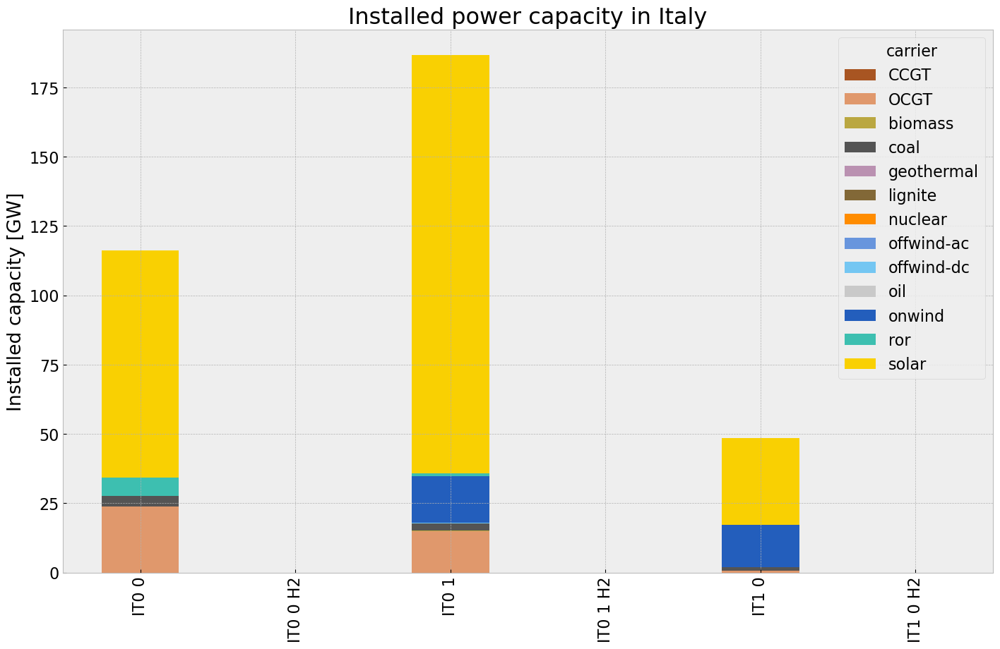

<Figure size 640x480 with 0 Axes>

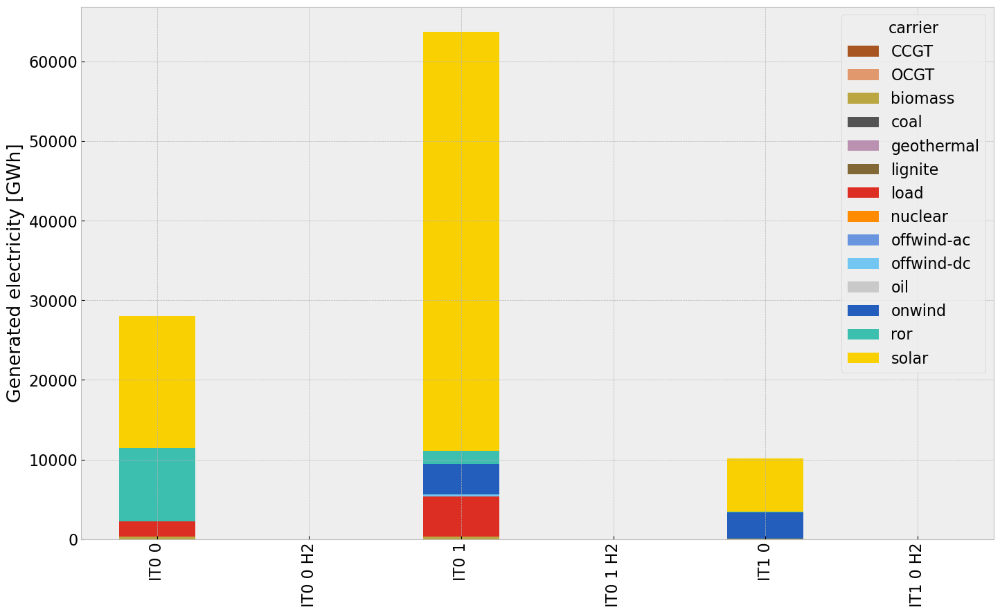

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\4143458403.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\4143458403.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\1216850111.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  links = n.links_t.p1.groupby(n.links.carri

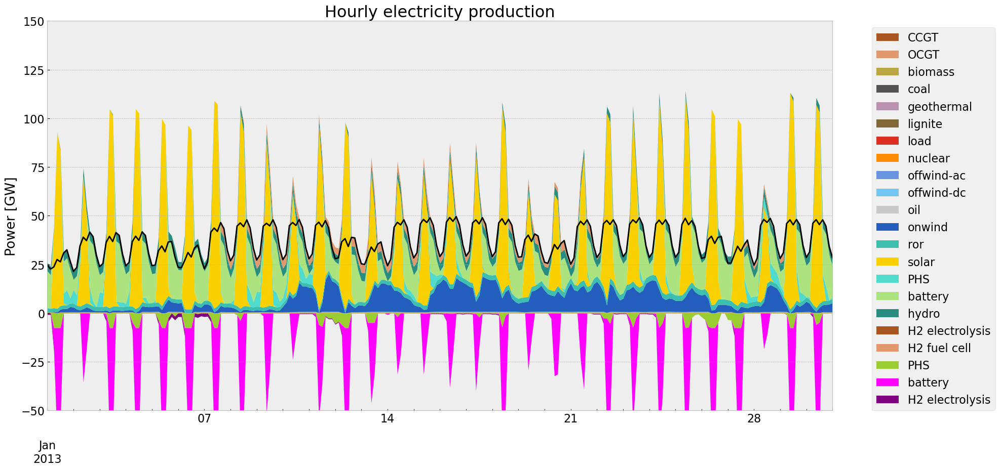

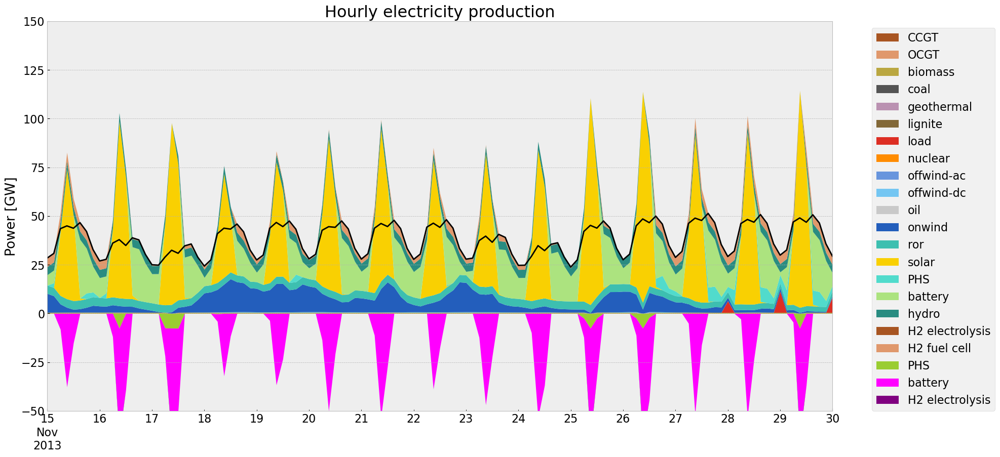

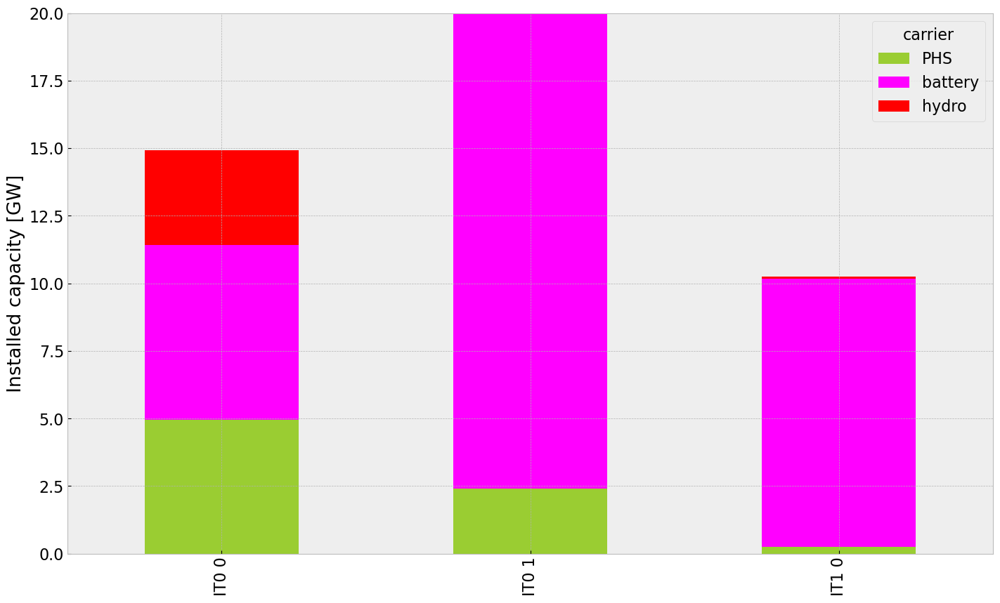

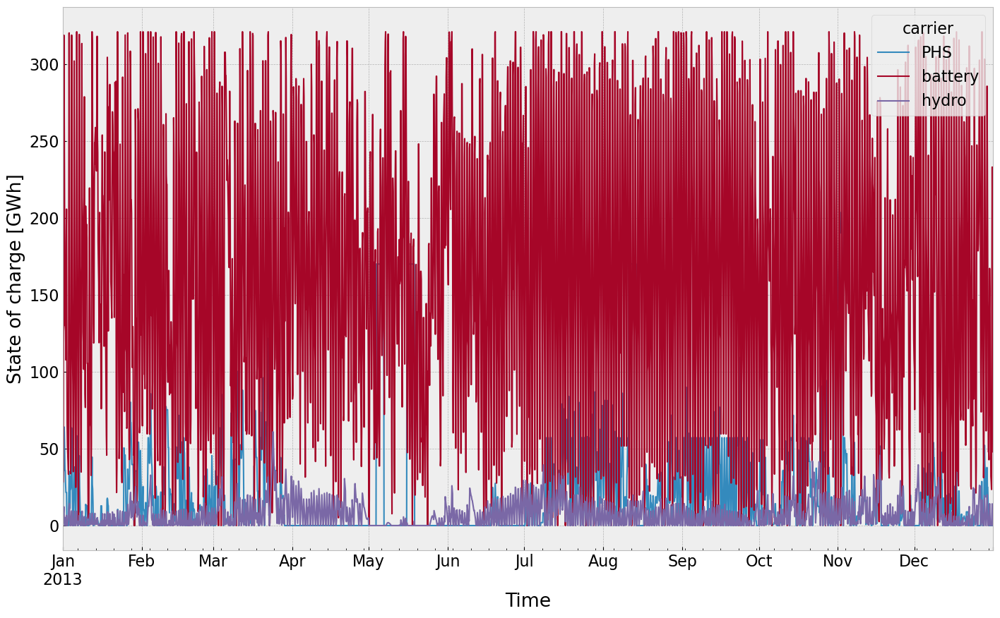

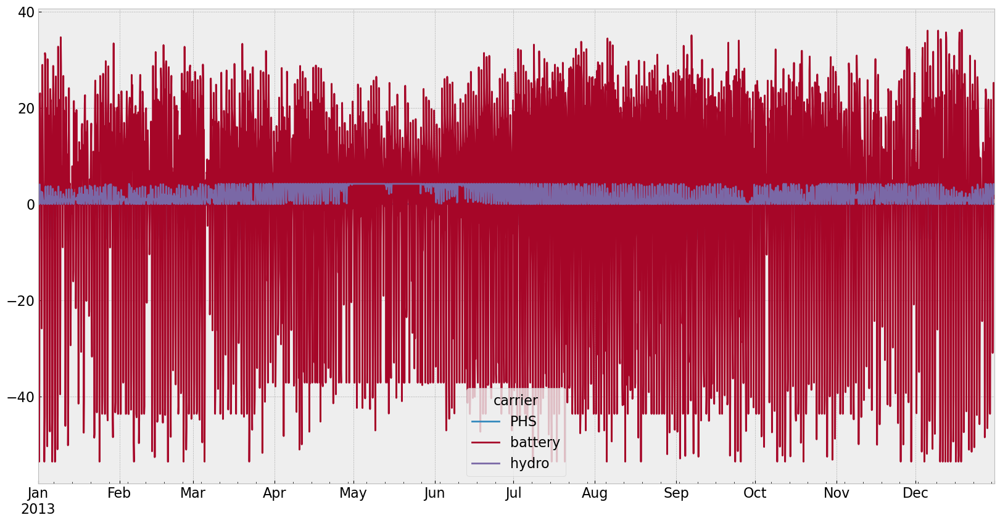

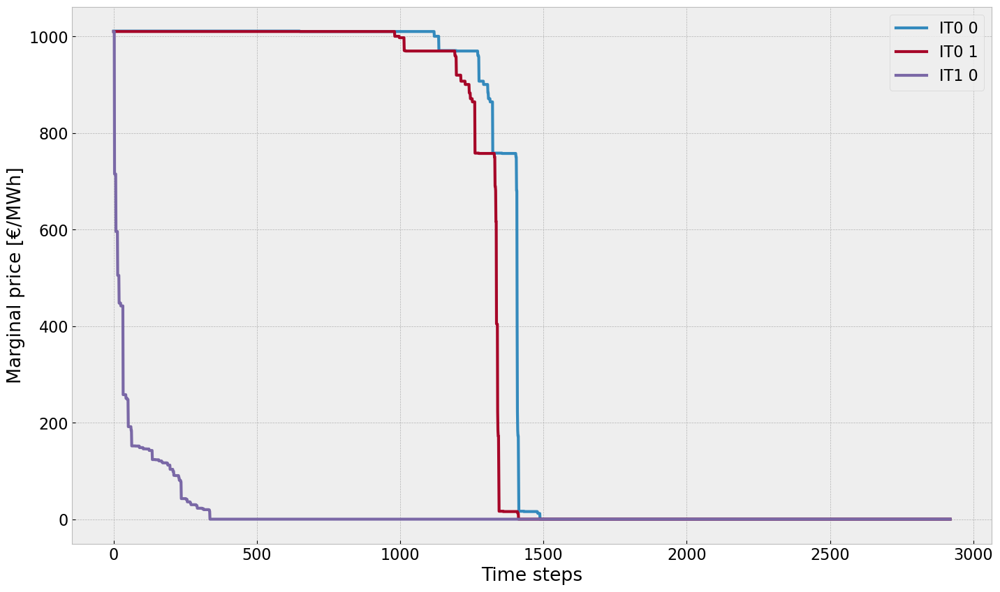

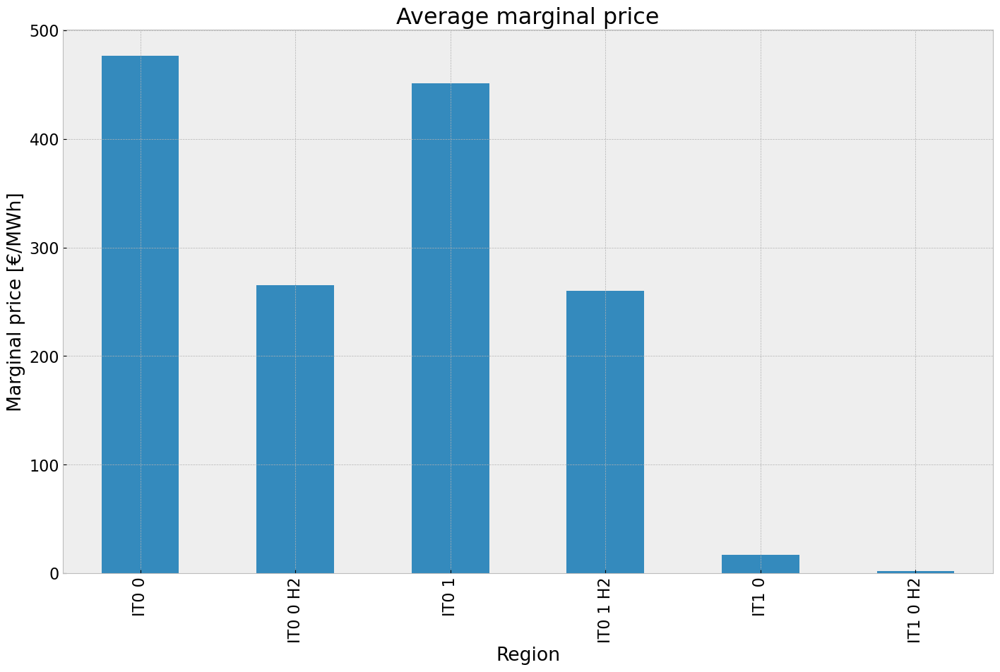

In [210]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n1, '2013-01-01', '2013-01-31', colors_gen)
gen_curve(n1, '2013-11-15', '2013-11-30', colors_gen)

#installed storage unit
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)

# Scenario Analysis

## Installed Capacity

In [196]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

In [197]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,39.420200,39.420200,39.420200,39.420200
Biomass,0.508000,0.508000,0.508000,0.508000
Coal,7.275926,7.275926,7.275926,7.275926
Geothermal,0.059000,0.059000,0.059000,0.059000
Lignite,0.000000,0.000000,0.000000,0.000000
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,0.000000,0.000000,0.000000,0.000000
Offshore Wind DC,0.384920,0.384920,0.384920,0.384920


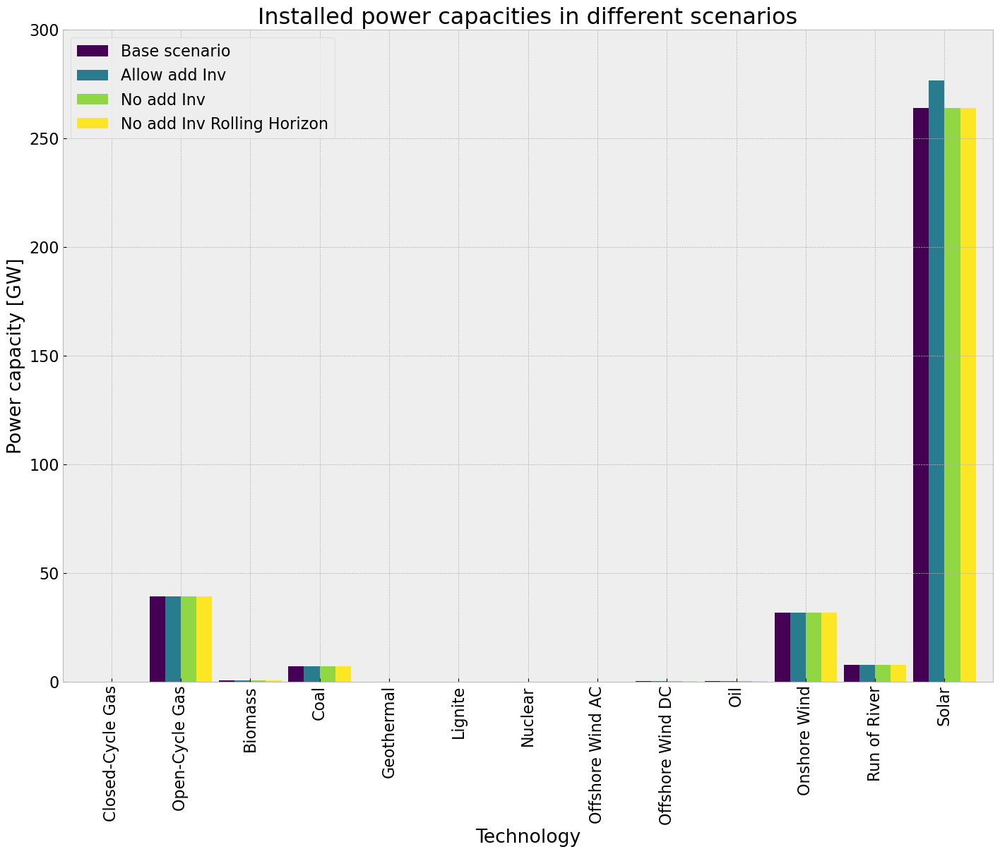

In [198]:
#colors = cm.viridis(np.linspace(0, 5, len(comp_inst_cap)))

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        ylim=[0,300],
                        width=0.9
)
plt.show()

## Power Generation

In [199]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)

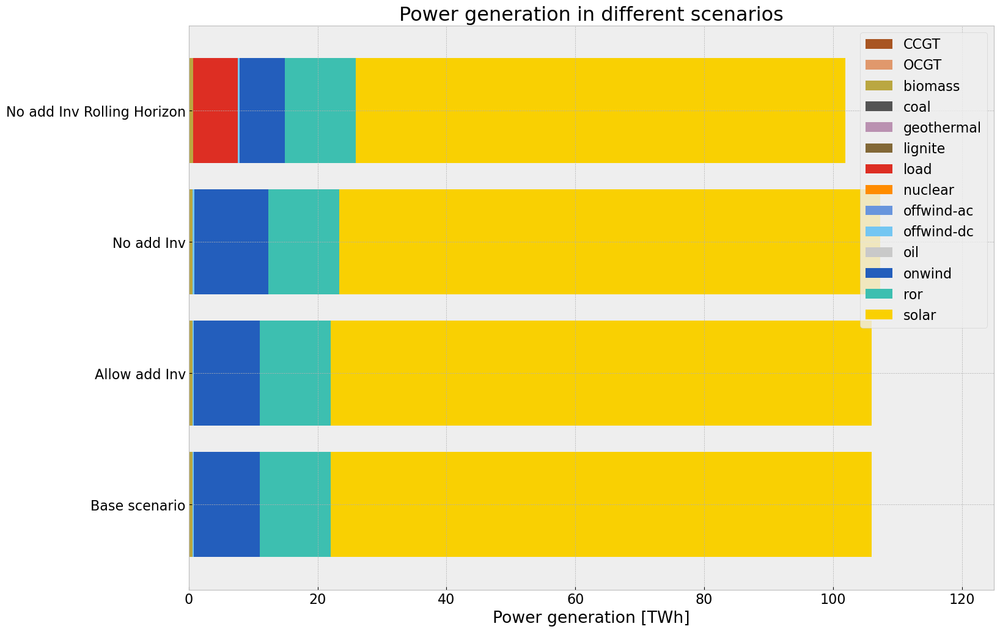

In [212]:
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        xlim=[0,125],
                        width=0.8
)
plt.show()

## Average System Cost

In [201]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

if 'AC' in system_cost_base:
    comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\2925963551.py:30: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  comp_system_cost.fillna(0, inplace=True)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\810435327.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\810435327.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


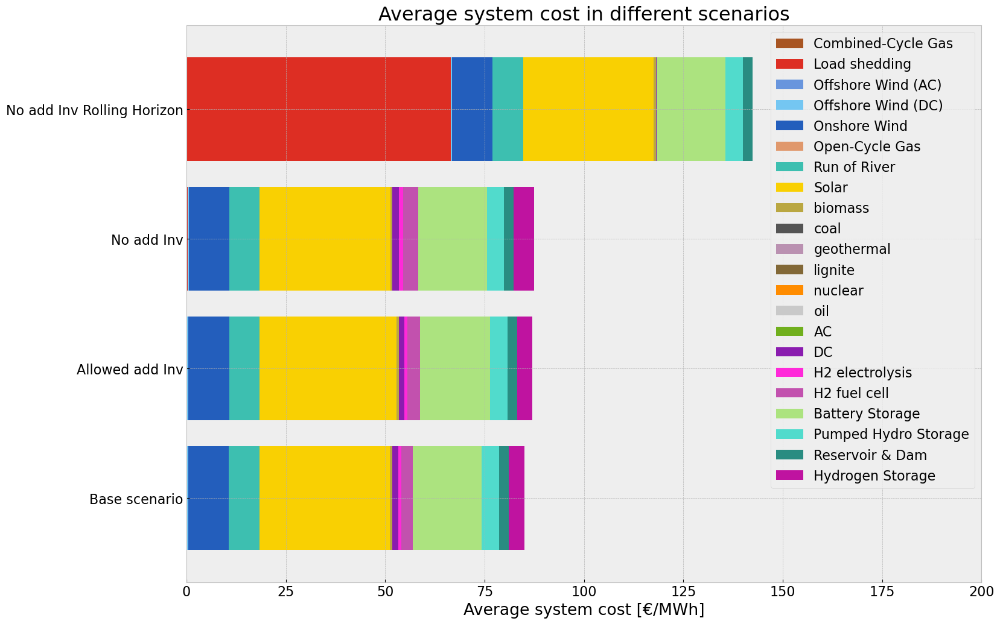

In [215]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        xlim=[0,200],
                        width=0.8
)
plt.show()

In [222]:
n.generators_t.p.sum()#.groupby(n.generators.carrier).sum()

Generator
IT0 0 CCGT          0.000000e+00
IT0 0 H2 load       0.000000e+00
IT0 0 OCGT          0.000000e+00
IT0 0 biomass       2.509315e+05
IT0 0 coal          0.000000e+00
IT0 0 geothermal    0.000000e+00
IT0 0 lignite       0.000000e+00
IT0 0 load          0.000000e+00
IT0 0 nuclear       0.000000e+00
IT0 0 offwind-ac    0.000000e+00
IT0 0 offwind-dc    0.000000e+00
IT0 0 oil           0.000000e+00
IT0 0 onwind        0.000000e+00
IT0 0 ror           9.212249e+06
IT0 0 solar         1.921913e+07
IT0 1 CCGT          0.000000e+00
IT0 1 H2 load       0.000000e+00
IT0 1 OCGT          0.000000e+00
IT0 1 biomass       2.601065e+05
IT0 1 coal          0.000000e+00
IT0 1 geothermal    0.000000e+00
IT0 1 lignite       0.000000e+00
IT0 1 load          2.343639e+07
IT0 1 nuclear       0.000000e+00
IT0 1 offwind-ac    0.000000e+00
IT0 1 offwind-dc    2.368335e+05
IT0 1 oil           0.000000e+00
IT0 1 onwind        3.553406e+06
IT0 1 ror           1.708369e+06
IT0 1 solar         5.021498e+07


In [223]:
n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2).sum(axis=1)

component    carrier             
Link         DC                      1.617515e+07
             DC                     -1.617515e+07
             H2 electrolysis        -3.247159e+06
             H2 electrolysis        -1.940237e+06
             H2 electrolysis         0.000000e+00
             H2 fuel cell            1.009379e+06
             H2 fuel cell            6.031226e+05
             H2 fuel cell            0.000000e+00
Load         -                      -6.466586e+07
             -                      -3.575673e+07
             -                      -4.919661e+06
StorageUnit  Battery Storage        -1.468214e+05
             Battery Storage        -1.002132e+06
             Battery Storage        -2.354550e+05
             Pumped Hydro Storage   -5.855080e+05
             Pumped Hydro Storage   -4.702677e+05
             Pumped Hydro Storage   -4.230863e+04
             Reservoir & Dam         4.560443e+06
             Reservoir & Dam         7.871791e+05
             Res

## Curtailment

In [203]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [204]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_17000\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


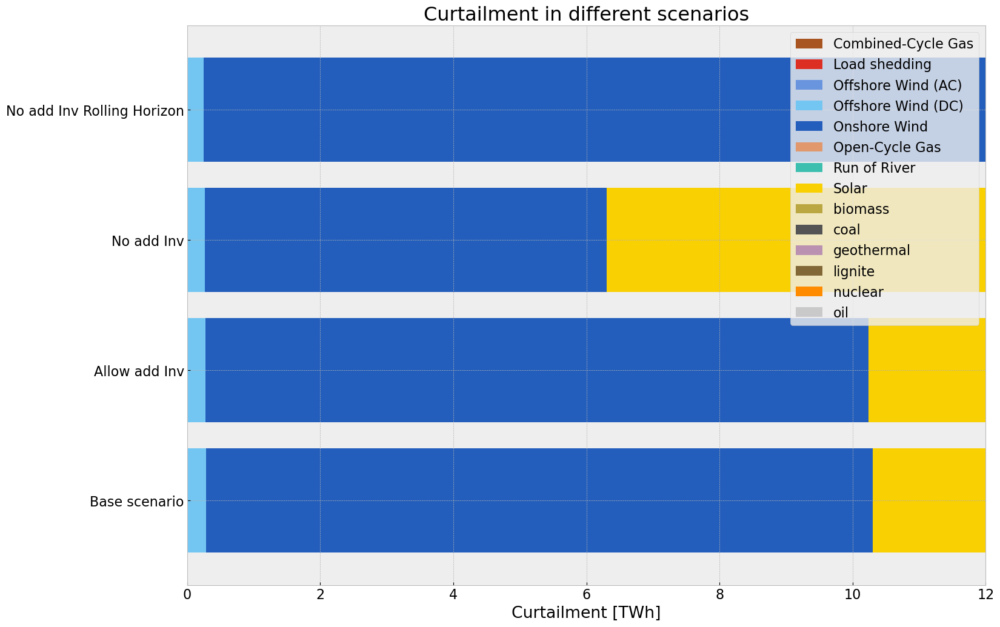

In [205]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        xlim=[0,12],
                        width=0.8
)
plt.show()